In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision
import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights
from torchvision.models import resnet50,ResNet50_Weights
import copy
import cv2
import numpy as np
import os



In [ ]:
!pip install lpips

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 1.7 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

### 1. Read the image

In [ ]:
# Define a function to calculate the residual image by subtracting the reconstructed image from the original
def calculate_residual(original_path, reconstructed_path):
    # Read the original and reconstructed images
    #print(original_path)
    original = cv2.imread(original_path, cv2.IMREAD_UNCHANGED)
    reconstructed = cv2.imread(reconstructed_path, cv2.IMREAD_UNCHANGED)
    #print(original)

    # Convert images to float for accurate subtraction
    original_float = original.astype(np.float32)
    reconstructed_float = reconstructed.astype(np.float32)

    # Calculate the residual
    residual = cv2.absdiff(original,reconstructed)

    # Clip values to the range [0, 255] and convert to uint8
    residual_clipped = np.clip(residual, 0, 255).astype(np.uint8)

    return residual_clipped

In [ ]:
!ls drive/MyDrive/BDRP_CS/

 images					      'real scenes (NDS)-20240215T090225Z-002.zip'
'n3_text (1).mp4'			      'real scenes (NDS)-20240215T090225Z-003.zip'
 node_embedding.npy			      'real scenes (NDS)-20240215T090225Z-004.zip'
'real scenes (NDS)'			      'real scenes (NDS)-20240215T090225Z-005.zip'
'real scenes (NDS)-20240215T090225Z-001.zip'   test_data


In [ ]:
reconstruct_image_path = "drive/MyDrive/BDRP_CS/test_data/originalNeRF_400pxs_1epoch-20240130T095901Z-001/originalNeRF_400pxs_1epoch/reconstructed/"
origin_path = "drive/MyDrive/BDRP_CS/test_data/originalNeRF_400pxs_1epoch-20240130T095901Z-001/originalNeRF_400pxs_1epoch/original/"

reconstruct_image_paths = sorted([reconstruct_image_path + i for i in os.listdir(reconstruct_image_path)])
origin_paths = sorted([origin_path + i for i in os.listdir(origin_path)])

print(origin_paths[0:1])
print(reconstruct_image_paths[0:1])

['drive/MyDrive/BDRP_CS/test_data/originalNeRF_400pxs_1epoch-20240130T095901Z-001/originalNeRF_400pxs_1epoch/original/10.png']
['drive/MyDrive/BDRP_CS/test_data/originalNeRF_400pxs_1epoch-20240130T095901Z-001/originalNeRF_400pxs_1epoch/reconstructed/10.png']


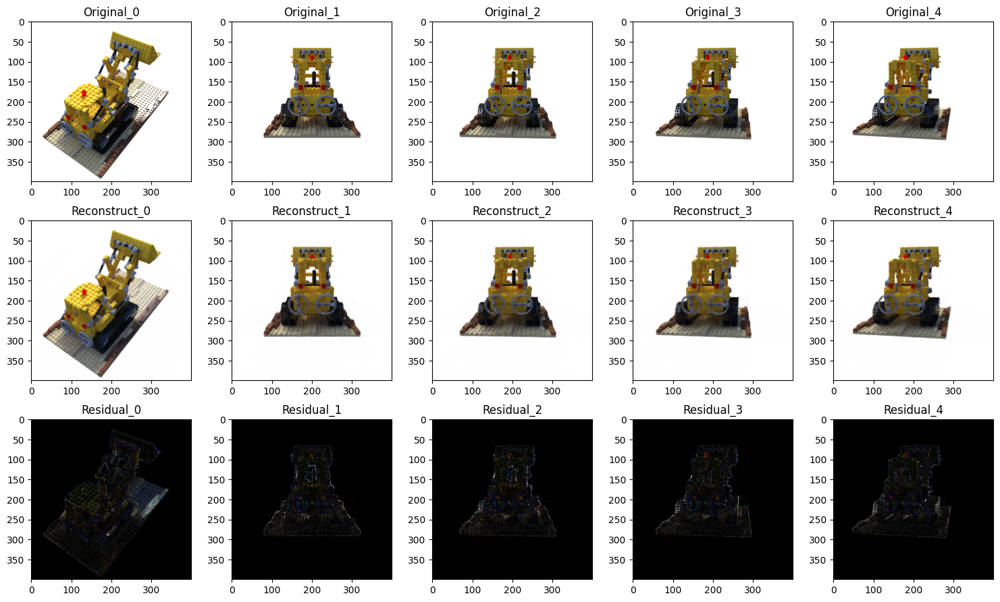

In [ ]:
reconstruct_images = [cv2.imread(i) for i in reconstruct_image_paths[0:5] ]
origin_images = [cv2.imread(i) for i in origin_paths[0:5]]

residual_images = [calculate_residual(i,j) for i,j in zip(origin_paths[0:5],reconstruct_image_paths[0:5])]



fig, axs = plt.subplots(3, 5, figsize=(15, 9))
for i,image in enumerate(origin_images[0:5]):
    axs[0,i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[0,i].set_title(f"Original_{i}")

for i,image in enumerate(reconstruct_images[0:5]):
    axs[1,i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[1,i].set_title(f"Reconstruct_{i}")

for i,image in enumerate(residual_images[0:5]):
    axs[2,i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[2,i].set_title(f"Residual_{i}")

plt.tight_layout()

## 1.2 NDS Examples

887 nds outputs, 1174 original images
- > 885 common pairs

In [ ]:
!ls 'drive/MyDrive/BDRP_CS/real scenes (NDS)/'

 images       'images (2)'   images_resized    nds_outputLong2_resized
'images (1)'  'images (3)'   nds_outputLong2


In [ ]:
!ls 'drive/MyDrive/BDRP_CS/real scenes (NDS)/nds_outputLong2/' |wc -l

885


In [ ]:
!ls 'drive/MyDrive/BDRP_CS/real scenes (NDS)/images (1)/' |wc -l

885


In [ ]:
!ls 'drive/MyDrive/BDRP_CS/real scenes (NDS)/nds_outputLong2_resized/' |wc -l

775


In [ ]:
!ls 'drive/MyDrive/BDRP_CS/real scenes (NDS)/images_resized/' |wc -l

775


In [ ]:
reconstruct_image_NDS_path = "drive/MyDrive/BDRP_CS/real scenes (NDS)/nds_outputLong2_resized/"
origin_NDS_path = "drive/MyDrive/BDRP_CS/real scenes (NDS)/images_resized/"

reconstruct_image_NDS_paths = sorted([reconstruct_image_NDS_path + i for i in os.listdir(reconstruct_image_NDS_path)])
origin_NDS_paths = sorted([origin_NDS_path + i for i in os.listdir(origin_NDS_path)])

print(origin_NDS_paths[0:1])
print(reconstruct_image_NDS_paths[0:1])

['drive/MyDrive/BDRP_CS/real scenes (NDS)/images_resized/003260aab52f811d32c7f973305d74f7.jpg']
['drive/MyDrive/BDRP_CS/real scenes (NDS)/nds_outputLong2_resized/003260aab52f811d32c7f973305d74f7.jpg']


In [ ]:
files1 = set(os.listdir(reconstruct_image_NDS_path))
files2 = set(os.listdir(origin_NDS_path))

common_files = files1.intersection(files2)
len(common_files)

775

In [ ]:
reconstruct_NDS_images = [cv2.imread(i) for i in reconstruct_image_NDS_paths[0:5]  ]
origin_NDS_images = [cv2.imread(i) for i in origin_NDS_paths[0:5]]

residual_NDS_images = [calculate_residual(i,j) for i,j in zip(origin_NDS_paths[0:5] ,reconstruct_image_NDS_paths[0:5]  )]



fig, axs = plt.subplots(3, 5, figsize=(15, 9))
for i,image in enumerate(origin_NDS_images[0:5]):
    axs[0,i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[0,i].set_title(f"Original_{i}")

for i,image in enumerate(reconstruct_NDS_images[0:5]):
    axs[1,i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[1,i].set_title(f"Reconstruct_{i}")

for i,image in enumerate(residual_NDS_images[0:5]):
    axs[2,i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[2,i].set_title(f"Residual_{i}")

plt.tight_layout()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# # Define the path to the directory containing the original images
# source_dir = 'drive/MyDrive/BDRP_CS/real scenes (NDS)/images (1)/'
# # Define the path to the directory where resized images will be saved
# target_dir = 'drive/MyDrive/BDRP_CS/real scenes (NDS)/images_resized/'

# # Ensure the target directory exists
# os.makedirs(target_dir, exist_ok=True)

# # Define a transform to resize the images
# transform = transforms.Compose([
#     transforms.Resize((400, 400))
# ])

# # Process and save the resized images
# for filename in os.listdir(source_dir):
#     if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
#         # Construct the full path to the original image
#         img_path = os.path.join(source_dir, filename)
#         try:
#             # Load the image
#             image = Image.open(img_path).convert('RGB')
#             # Apply the resizing transformation
#             image_resized = transform(image)
#             # Construct the full path to the save location
#             save_path = os.path.join(target_dir, filename)
#             # Save the resized image
#             image_resized.save(save_path)
#         except IOError:
#             print(f"Error processing {filename}, skipping.")

# print("Resizing completed.")

## 2. Stats

In [ ]:
from scipy.stats import skew, kurtosis
def calculate_statistics(original_image_folder,reconstructed_image_folder):
    #original_image_folder : Something like drive/MyDrive/BDRP_CS/test_data/originalNeRF_400pxs_1epoch-20240130T095901Z-001/originalNeRF_400pxs_1epoch/reconstructed/
    #reconstructed_image_folder: Something like drive/MyDrive/BDRP_CS/test_data/originalNeRF_400pxs_1epoch-20240130T095901Z-001/originalNeRF_400pxs_1epoch/original/

    #Reconstruct_path and Original Path
    r_paths = sorted([reconstructed_image_folder + i for i in os.listdir(reconstructed_image_folder)])
    o_paths = sorted([original_image_folder + i for i in os.listdir(original_image_folder)])

    r_images = [cv2.imread(i) for i in r_paths]
    o_images = [cv2.imread(i) for i in o_paths]

    resi_images = [calculate_residual(i,j) for i,j in zip(o_paths,r_paths)]

    #average of all means
    mean = np.mean([np.mean(resi_image) for resi_image in resi_images])
    #average of all stds
    std = np.mean([np.std(resi_image) for resi_image in resi_images])
    #average of all skewness

    skewness = np.mean([skew(resi_image.flatten()) for resi_image in resi_images])
    #average of all kurtosis
    kurtosisvalue = np.mean([kurtosis(resi_image.flatten()) for resi_image in resi_images])

    return mean, std, skewness, kurtosisvalue


calculate_statistics(origin_path,reconstruct_image_path)

KeyboardInterrupt: 

In [ ]:
import os
import torch
from PIL import Image
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torch import Generator

class CustomImageDataset(Dataset):
    def __init__(self, reconstructed_dir, ground_truth_dir, transform=None):
        self.reconstructed_dir = reconstructed_dir
        self.ground_truth_dir = ground_truth_dir
        self.transform = transform

        self.filenames = os.listdir(reconstructed_dir)

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        recon_img_name = os.path.join(self.reconstructed_dir, self.filenames[idx])
        gt_img_name = os.path.join(self.ground_truth_dir, self.filenames[idx])

        recon_image = Image.open(recon_img_name)
        gt_image = Image.open(gt_img_name)

        if self.transform:
            recon_image = self.transform(recon_image)
            gt_image = self.transform(gt_image)

        return recon_image, gt_image

# Normalization parameters for VGG-19
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

# Data augmentation and normalization for the training set
train_transform = transforms.Compose([
    transforms.Resize((400, 400)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    #transforms.ColorJitter(brightness=0.05, contrast=0.05, saturation=0.05),
    transforms.ToTensor(),
    normalize
])

# Transform with normalization (without augmentation) for validation and test set
val_test_transform = transforms.Compose([
    transforms.Resize((400, 400)),
    transforms.ToTensor(),
    normalize
])

# Creating the dataset
full_dataset = CustomImageDataset(reconstructed_dir=reconstruct_image_path,
                                  ground_truth_dir=origin_path,
                                  transform=train_transform)

# Splitting the dataset
train_size = int(0.95 * len(full_dataset))
val_size = test_size = (len(full_dataset) - train_size) // 2

g = Generator()
g.manual_seed(42)  # You can choose any seed value

full_dataset2 = CustomImageDataset(reconstructed_dir=reconstruct_image_NDS_path,
                                  ground_truth_dir=origin_NDS_path,
                                  transform=train_transform)




In [ ]:
#print(train_size,val_size,test_size)
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size],generator = g)


# Applying the transform for validation and test set
val_dataset.dataset.transform = val_test_transform
test_dataset.dataset.transform = val_test_transform


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

train_loader2 = DataLoader(full_dataset2, batch_size=64, shuffle=True)

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
from torch.utils.data import DataLoader


# Modify VGG-19 for feature extraction
class VGG19Encoder(nn.Module):
    def __init__(self):
        super(VGG19Encoder, self).__init__()
        vgg19 = models.vgg19(pretrained=True).features
        self.features = nn.Sequential(*list(vgg19.children())[:-1])  # Remove last maxpool layer
        for param in self.features.parameters():
            param.requires_grad = False

    def forward(self, x):
        return self.features(x)

def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=False, instance_norm=False, dropout=False, dropout_ratio=0.5):

    #Add layers
    layers = []
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))

    #Batch normalization
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))

    #Instance normalization
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))

    #Dropout
    if dropout:
        layers.append(nn.Dropout2d(dropout_ratio))

    return nn.Sequential(*layers)


def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=False, instance_norm=False):
    """
    Creates a convolutional layer, with optional batch / instance normalization.
    """

    #Add layers
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    layers.append(conv_layer)

    #Batch normalization
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))

    #Instance normalization
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))
    return nn.Sequential(*layers)


class ResidualBlock(nn.Module):

    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        """
        Residual blocks help the model to effectively learn the transformation from one domain to another.
        """
        self.conv1 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=True)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=True)

    def forward(self, x):
        out_1 = F.relu(self.conv1(x))
        out_2 = x + self.conv2(out_1)
        return out_2

class ChannelAttention(nn.Module):
    def __init__(self, in_channels, reduction_ratio=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // reduction_ratio, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(in_channels // reduction_ratio, in_channels, 1, bias=False)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        out = avg_out + max_out
        return self.sigmoid(out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)


class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        # Simplified decoder architecture with fewer layers


        self.decoder = nn.Sequential(
            deconv(512, 256, kernel_size=4, stride=2, padding=1,batch_norm = True),  # Output: 48x48
            nn.ReLU(),
            ResidualBlock(256),
            #ChannelAttention(256),
            deconv(256, 128, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            deconv(128, 3, kernel_size=4, stride=2, padding=1),
            nn.Upsample(size=(400, 400), mode='bilinear', align_corners=False),  # Upsample to 400x400
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.decoder(x)

# Combine Encoder and Decoder
class EnhancementModel(nn.Module):
    def __init__(self):
        super(EnhancementModel, self).__init__()
        self.encoder = VGG19Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

model = EnhancementModel().to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def tensor_to_rgb(tensor):
    # Clamp the values in the tensor to the range [0, 1]
    tensor = torch.clamp(tensor, 0, 1)
    # Permute the tensor from (channels, height, width) to (height, width, channels)
    tensor = tensor.permute(1, 2, 0)
    # Convert to numpy array
    numpy_image = tensor.cpu().detach().numpy()
    # The numpy image is now in the range [0, 1], suitable for displaying as RGB
    return numpy_image

def display_images(original, ground_truth, enhanced):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(tensor_to_rgb(original))
    plt.title('Reconstructed Image')
    plt.axis('off')

    # Ground Truth Image
    plt.subplot(1, 3, 2)
    plt.imshow(tensor_to_rgb(ground_truth))
    plt.title('Ground Truth')
    plt.axis('off')

    # Enhanced Image
    plt.subplot(1, 3, 3)
    plt.imshow(tensor_to_rgb(enhanced))
    plt.title('Enhanced Image')
    plt.axis('off')

    plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage.feature import graycomatrix, graycoprops
import numpy as np

class CustomLoss(nn.Module):
    def __init__(self, mse_weight=1.0, frequency_weight=1.0, glcm_weight=1.0):
        super(CustomLoss, self).__init__()
        self.mse_weight = mse_weight
        self.frequency_weight = frequency_weight
        self.glcm_weight = glcm_weight

    def forward(self, reconstructed, ground_truth):
        # Compute the MSE loss
        mse_loss = F.mse_loss(reconstructed, ground_truth)

        # Compute the frequency spectrum similarity loss
        frequency_loss = self.compute_frequency_loss(reconstructed, ground_truth)

        # Compute the GLCM property loss
        glcm_loss = self.compute_glcm_loss(reconstructed, ground_truth)

        #print(mse_loss,frequency_loss,glcm_loss)

        # Combine the losses
        total_loss = self.mse_weight * mse_loss + self.frequency_weight * frequency_loss + self.glcm_weight * glcm_loss
        print("Total_loss: ", total_loss)

        return total_loss

    # ... [Frequency loss function code here] ...

    def compute_glcm_loss(self, reconstructed, ground_truth):
        glcm_loss = 0
        batch_size = reconstructed.shape[0]

        for b in range(batch_size):
            # Convert to grayscale if necessary
            # Assuming images are in shape [Batch, Channels, Height, Width] and in range [0, 1]
            if reconstructed.shape[1] > 1:  # More than one channel
                recon_gray = 0.299 * reconstructed[b, 0, :, :] + 0.587 * reconstructed[b, 1, :, :] + 0.114 * reconstructed[b, 2, :, :]
                gt_gray = 0.299 * ground_truth[b, 0, :, :] + 0.587 * ground_truth[b, 1, :, :] + 0.114 * ground_truth[b, 2, :, :]
            else:
                recon_gray = reconstructed[b, 0, :, :]
                gt_gray = ground_truth[b, 0, :, :]

            # Convert to numpy and scale to [0, 255]
            recon_gray_np = (recon_gray.cpu().detach().numpy() * 255).astype(np.uint8)
            gt_gray_np = (gt_gray.cpu().detach().numpy() * 255).astype(np.uint8)

            # Compute GLCM
            distances = [1]  # Example: distance of 1 pixel
            angles = [0, np.pi/2]  # Example: horizontal and vertical
            glcm_recon = graycomatrix(recon_gray_np, distances, angles, 256, symmetric=True, normed=True)
            glcm_gt = graycomatrix(gt_gray_np, distances, angles, 256, symmetric=True, normed=True)

            # Compute GLCM properties (e.g., contrast and homogeneity)
            contrast_recon = graycoprops(glcm_recon, 'contrast')
            contrast_gt = graycoprops(glcm_gt, 'contrast')
            homogeneity_recon = graycoprops(glcm_recon, 'homogeneity')
            homogeneity_gt = graycoprops(glcm_gt, 'homogeneity')

            # Calculate loss for this image and accumulate
            contrast_loss = np.mean((contrast_recon - contrast_gt) ** 2)
            homogeneity_loss = np.mean((homogeneity_recon - homogeneity_gt) ** 2)

            energy_recon = np.sum(glcm_recon ** 2)
            energy_gt = np.sum(glcm_gt ** 2)

            correlation_recon = graycoprops(glcm_recon, 'correlation')
            correlation_gt = graycoprops(glcm_gt, 'correlation')
            asm_recon = graycoprops(glcm_recon, 'ASM')
            asm_gt = graycoprops(glcm_gt, 'ASM')

            # Calculate loss for each property and accumulate
            energy_loss = np.mean((energy_recon - energy_gt) ** 2)
            correlation_loss = np.mean((correlation_recon - correlation_gt) ** 2)
            asm_loss = np.mean((asm_recon - asm_gt) ** 2)



            #print("Constrast",contrast_loss,homogeneity_loss,energy_loss,correlation_loss,asm_loss)
            glcm_loss += (0.0000001 * contrast_loss + homogeneity_loss + energy_loss  + correlation_loss + asm_loss)





        # Normalize the loss by the batch size
        glcm_loss /= batch_size
        #print(glcm_loss)

        return torch.tensor(glcm_loss, dtype=torch.float32)

    def compute_frequency_loss(self, reconstructed, ground_truth):
        # Apply Fourier Transform to both images
        recon_freq = torch.fft.fft2(reconstructed)
        gt_freq = torch.fft.fft2(ground_truth)

        # Compute the magnitude spectra (ignore phase information)
        recon_magnitude = torch.abs(recon_freq)
        gt_magnitude = torch.abs(gt_freq)

        # Compute the loss based on the magnitude spectra (e.g., MSE)
        frequency_loss = F.mse_loss(recon_magnitude, gt_magnitude)

        return frequency_loss


class HighFrequencyEmphasisLoss(nn.Module):
    def __init__(self, mse_weight=1.0, gdl_weight=1.0,frequency_weight = 0.000002):
        super(HighFrequencyEmphasisLoss, self).__init__()
        self.mse_weight = mse_weight
        self.gdl_weight = gdl_weight
        self.frequency_weight = frequency_weight

    def forward(self, predicted, target):
        # Mean Squared Error Loss
        mse_loss = F.mse_loss(predicted, target)

        # Gradient Difference Loss
        gdl_loss = self.gradient_difference_loss(predicted, target)

        frequency_loss = self.compute_frequency_loss(predicted, target)

        #print(mse_loss,frequency_loss)
        # Combined Loss
        total_loss = self.mse_weight * mse_loss + self.gdl_weight * gdl_loss + self.frequency_weight * frequency_loss
        # total_loss = self.mse_weight * mse_loss + self.frequency_weight * frequency_loss
        print("Total_loss: ",total_loss)
        return total_loss

    def gradient_difference_loss(self, predicted, target):
        gdl_loss = 0.0

        for channel in range(predicted.shape[1]):
            # Calculate gradients for the current channel
            predicted_grad_x, predicted_grad_y = self.compute_gradients(predicted[:, channel, :, :].unsqueeze(1))
            target_grad_x, target_grad_y = self.compute_gradients(target[:, channel, :, :].unsqueeze(1))

            # Calculate gradient differences
            grad_diff_x = torch.abs(target_grad_x - predicted_grad_x)
            grad_diff_y = torch.abs(target_grad_y - predicted_grad_y)

            # Sum and average differences for the current channel
            gdl_loss += torch.mean(grad_diff_x) + torch.mean(grad_diff_y)

        # Average the loss over all channels
        gdl_loss /= predicted.shape[1]

        return gdl_loss

    @staticmethod
    def compute_gradients(tensor):
        # Sobel filters for gradient calculation
        sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32).view(1, 1, 3, 3).to(tensor.device)
        sobel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32).view(1, 1, 3, 3).to(tensor.device)

        # Gradient in X direction
        grad_x = F.conv2d(tensor, sobel_x, padding=1)

        # Gradient in Y direction
        grad_y = F.conv2d(tensor, sobel_y, padding=1)

        return grad_x, grad_y

    def compute_frequency_loss(self, reconstructed, ground_truth):
        # Apply Fourier Transform to both images
        recon_freq = torch.fft.fft2(reconstructed)
        gt_freq = torch.fft.fft2(ground_truth)

        # Compute the magnitude spectra (ignore phase information)
        recon_magnitude = torch.abs(recon_freq)
        gt_magnitude = torch.abs(gt_freq)

        # Compute the loss based on the magnitude spectra (e.g., MSE)
        frequency_loss = F.mse_loss(recon_magnitude, gt_magnitude)

        return frequency_loss

In [ ]:
# Training Loop
import lpips  # For LPIPS
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
# Initialize LPIPS
lpips_fn = lpips.LPIPS(net='alex')  # Using AlexNet as the backbone
lpips_fn = lpips_fn.to(device)

# To store metrics
psnr_values = []
ssim_values = []
lpips_values = []

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.10/dist-packages/lpips/weights/v0.1/alex.pth


Total_loss:  tensor(2.3348, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3282, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3082, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3230, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3324, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 0
Total_loss:  tensor(2.4447, device='cuda:0')
(4, 3, 400, 400)


<ipython-input-43-a8d53bcd4bc3>:46: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]


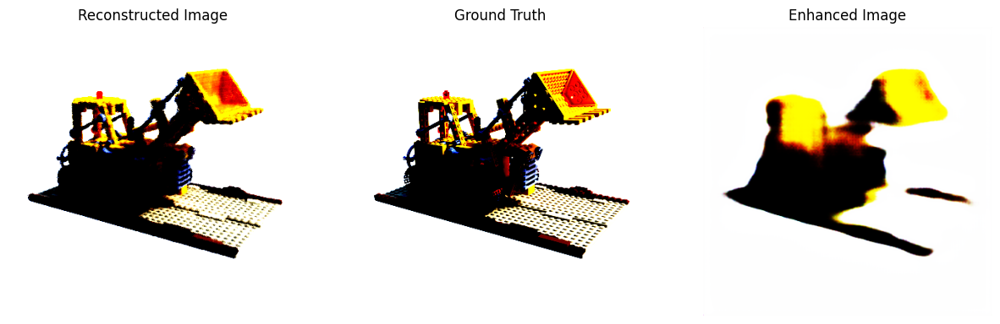

Epoch [1/50], Loss: 2.4447, Avg PSNR: 10.8163, Avg SSIM: 0.4752, Avg LPIPS: 0.4205
Total_loss:  tensor(2.3200, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3079, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3251, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3286, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3016, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 1
Total_loss:  tensor(2.4310, device='cuda:0')
(4, 3, 400, 400)
Epoch [2/50], Loss: 2.4310, Avg PSNR: 10.8384, Avg SSIM: 0.4802, Avg LPIPS: 0.4162
Total_loss:  tensor(2.3262, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3050, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3280, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3013, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3223, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 2
Total_loss:  tensor(2.4389, device='cuda:0')
(4, 3, 400, 400)
Epoc

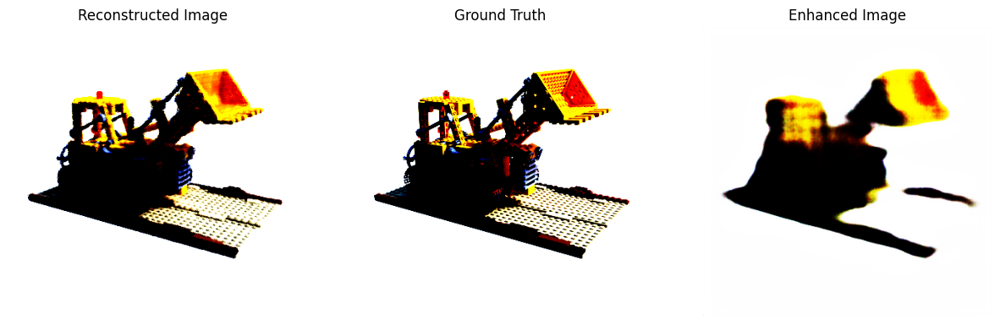

Epoch [6/50], Loss: 2.4284, Avg PSNR: 10.8435, Avg SSIM: 0.4797, Avg LPIPS: 0.4158
Total_loss:  tensor(2.3015, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3076, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2923, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3164, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3296, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 6
Total_loss:  tensor(2.4300, device='cuda:0')
(4, 3, 400, 400)
Epoch [7/50], Loss: 2.4300, Avg PSNR: 10.8406, Avg SSIM: 0.4789, Avg LPIPS: 0.4150
Total_loss:  tensor(2.3234, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2974, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2818, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3145, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3073, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 7
Total_loss:  tensor(2.4276, device='cuda:0')
(4, 3, 400, 400)
Epoc

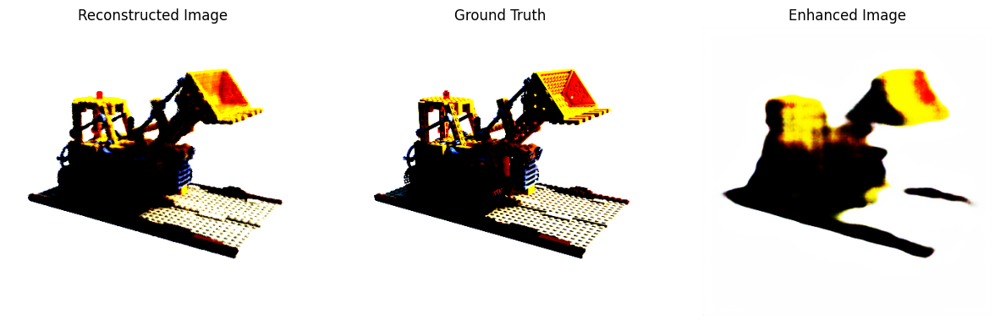

Epoch [11/50], Loss: 2.4275, Avg PSNR: 10.8444, Avg SSIM: 0.4795, Avg LPIPS: 0.4131
Total_loss:  tensor(2.2901, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2910, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3186, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3090, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2636, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 11
Total_loss:  tensor(2.4259, device='cuda:0')
(4, 3, 400, 400)
Epoch [12/50], Loss: 2.4259, Avg PSNR: 10.8476, Avg SSIM: 0.4796, Avg LPIPS: 0.4126
Total_loss:  tensor(2.3242, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2875, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2927, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2928, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2902, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 12
Total_loss:  tensor(2.4261, device='cuda:0')
(4, 3, 400, 400)


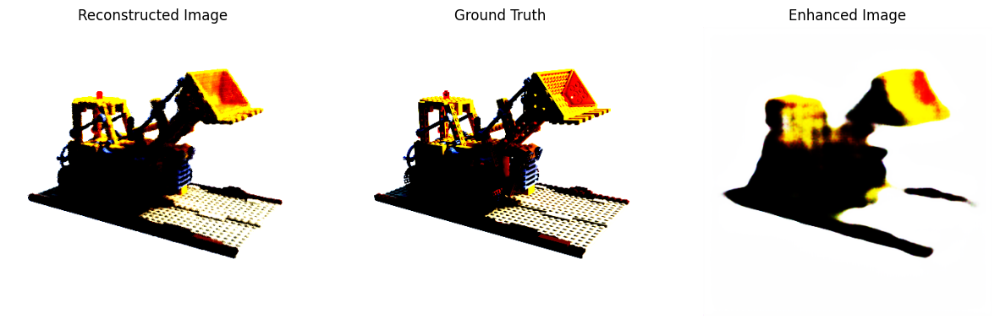

Epoch [16/50], Loss: 2.4253, Avg PSNR: 10.8492, Avg SSIM: 0.4798, Avg LPIPS: 0.4101
Total_loss:  tensor(2.2949, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2962, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2904, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3001, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2895, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 16
Total_loss:  tensor(2.4249, device='cuda:0')
(4, 3, 400, 400)
Epoch [17/50], Loss: 2.4249, Avg PSNR: 10.8493, Avg SSIM: 0.4799, Avg LPIPS: 0.4110
Total_loss:  tensor(2.3050, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2668, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3156, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2897, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2946, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 17
Total_loss:  tensor(2.4247, device='cuda:0')
(4, 3, 400, 400)


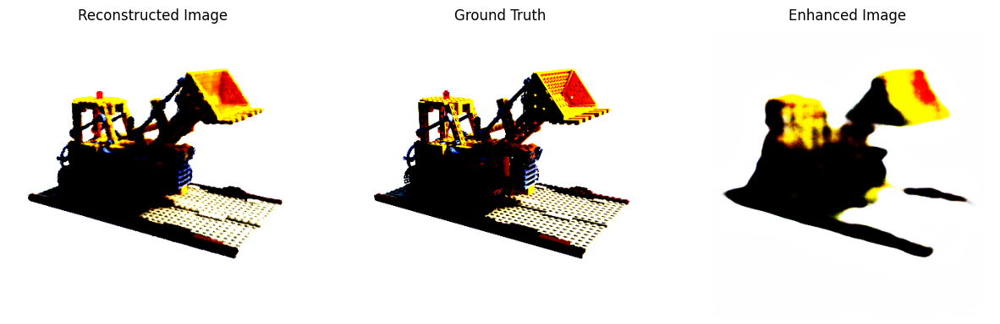

Epoch [21/50], Loss: 2.4257, Avg PSNR: 10.8490, Avg SSIM: 0.4797, Avg LPIPS: 0.4094
Total_loss:  tensor(2.2995, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3080, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2905, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2714, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2705, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 21
Total_loss:  tensor(2.4255, device='cuda:0')
(4, 3, 400, 400)
Epoch [22/50], Loss: 2.4255, Avg PSNR: 10.8489, Avg SSIM: 0.4795, Avg LPIPS: 0.4049
Total_loss:  tensor(2.3024, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3008, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2789, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2856, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2706, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 22
Total_loss:  tensor(2.4238, device='cuda:0')
(4, 3, 400, 400)


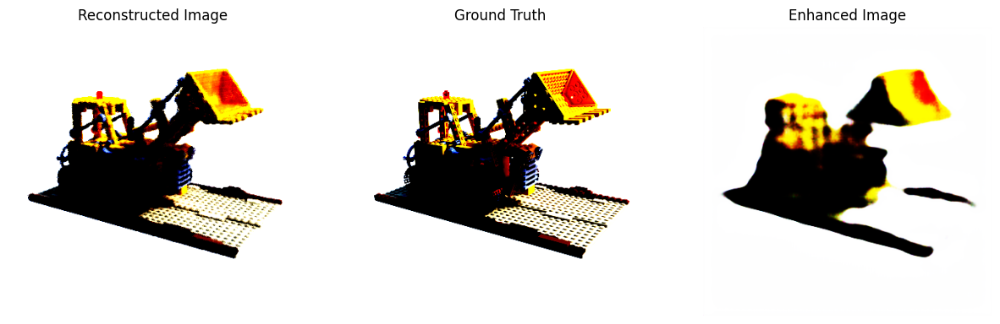

Epoch [26/50], Loss: 2.4267, Avg PSNR: 10.8479, Avg SSIM: 0.4803, Avg LPIPS: 0.4043
Total_loss:  tensor(2.2829, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2973, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3057, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2779, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2814, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 26
Total_loss:  tensor(2.4237, device='cuda:0')
(4, 3, 400, 400)
Epoch [27/50], Loss: 2.4237, Avg PSNR: 10.8528, Avg SSIM: 0.4803, Avg LPIPS: 0.4073
Total_loss:  tensor(2.2869, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2824, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2870, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3104, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2653, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 27
Total_loss:  tensor(2.4256, device='cuda:0')
(4, 3, 400, 400)


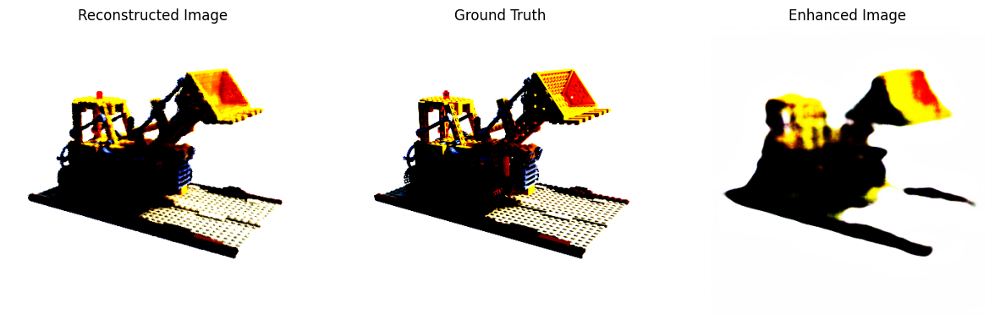

Epoch [31/50], Loss: 2.4243, Avg PSNR: 10.8540, Avg SSIM: 0.4801, Avg LPIPS: 0.4047
Total_loss:  tensor(2.2858, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2645, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2933, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3087, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2828, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 31
Total_loss:  tensor(2.4262, device='cuda:0')
(4, 3, 400, 400)
Epoch [32/50], Loss: 2.4262, Avg PSNR: 10.8488, Avg SSIM: 0.4800, Avg LPIPS: 0.4047
Total_loss:  tensor(2.3068, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2695, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2840, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2839, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2935, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 32
Total_loss:  tensor(2.4229, device='cuda:0')
(4, 3, 400, 400)


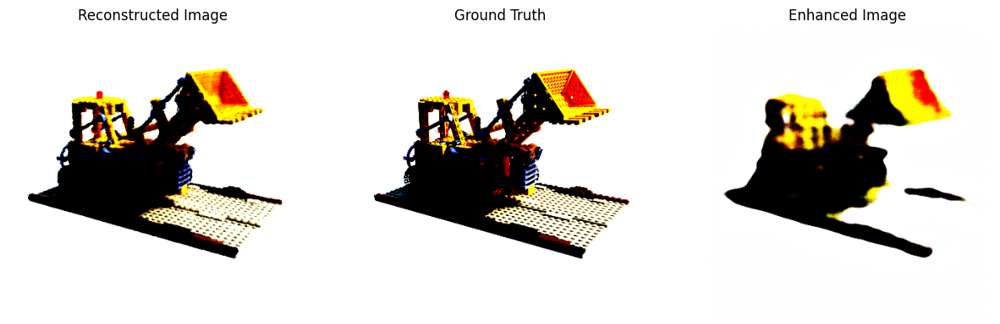

Epoch [36/50], Loss: 2.4254, Avg PSNR: 10.8504, Avg SSIM: 0.4798, Avg LPIPS: 0.4039
Total_loss:  tensor(2.2844, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2833, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2900, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2751, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2963, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 36
Total_loss:  tensor(2.4251, device='cuda:0')
(4, 3, 400, 400)
Epoch [37/50], Loss: 2.4251, Avg PSNR: 10.8512, Avg SSIM: 0.4801, Avg LPIPS: 0.4027
Total_loss:  tensor(2.2813, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2867, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2728, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2865, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3007, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 37
Total_loss:  tensor(2.4255, device='cuda:0')
(4, 3, 400, 400)


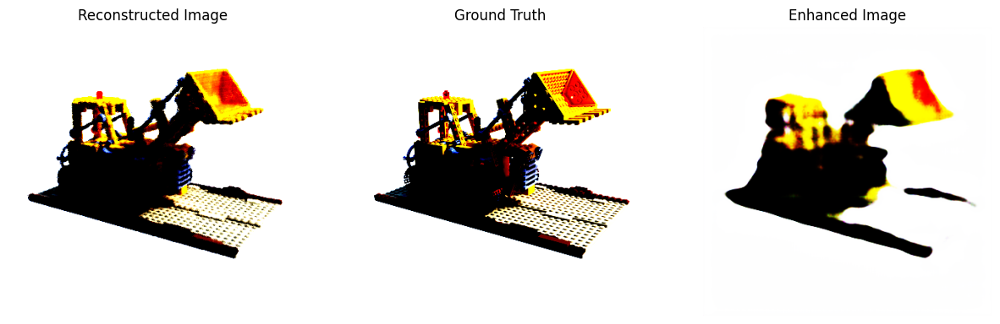

Epoch [41/50], Loss: 2.4240, Avg PSNR: 10.8526, Avg SSIM: 0.4806, Avg LPIPS: 0.4000
Total_loss:  tensor(2.2678, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2863, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2919, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2802, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2921, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 41
Total_loss:  tensor(2.4246, device='cuda:0')
(4, 3, 400, 400)
Epoch [42/50], Loss: 2.4246, Avg PSNR: 10.8510, Avg SSIM: 0.4806, Avg LPIPS: 0.4009
Total_loss:  tensor(2.2799, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2657, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2869, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2886, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3009, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 42
Total_loss:  tensor(2.4223, device='cuda:0')
(4, 3, 400, 400)


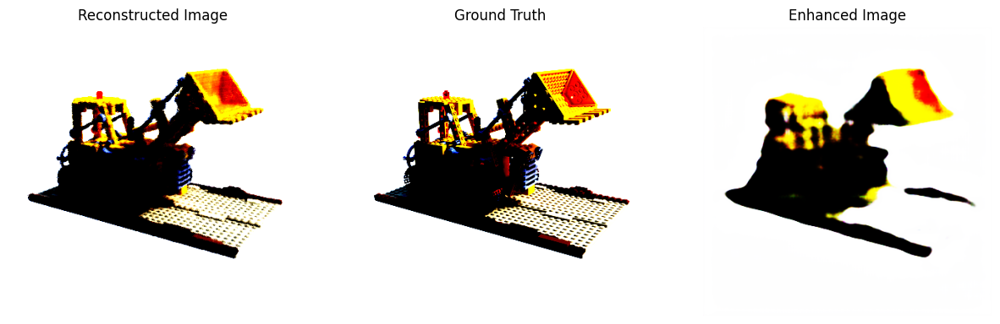

Epoch [46/50], Loss: 2.4265, Avg PSNR: 10.8497, Avg SSIM: 0.4799, Avg LPIPS: 0.4002
Total_loss:  tensor(2.2887, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2761, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2741, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2853, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2730, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 46
Total_loss:  tensor(2.4251, device='cuda:0')
(4, 3, 400, 400)
Epoch [47/50], Loss: 2.4251, Avg PSNR: 10.8523, Avg SSIM: 0.4803, Avg LPIPS: 0.4000
Total_loss:  tensor(2.2836, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2819, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2942, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2777, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.2291, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 47
Total_loss:  tensor(2.4271, device='cuda:0')
(4, 3, 400, 400)


In [ ]:


# criterion = CustomLoss(mse_weight=0.1, frequency_weight = 0.000002,glcm_weight=1.0)
criterion = HighFrequencyEmphasisLoss(mse_weight=1.0,gdl_weight = 0.5, frequency_weight= 0.0000001)
optimizer = torch.optim.Adam(model.decoder.parameters(), lr=1e-4)  # Only optimize decoder parameters

num_epochs = 50  # Define the number of epochs
for epoch in range(num_epochs):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # print(f"Inputs type: {inputs.type()}, device: {inputs.device}")
        # print(f"Labels type: {labels.type()}, device: {labels.device}")
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    #print("Validation Loop Now")
    # Validation Loop
    print(f"Epoch {epoch}")
    one_output = None
    model.eval()

    # Metrics storage for the current epoch
    epoch_psnr = []
    epoch_ssim = []
    epoch_lpips = []


    with torch.no_grad():
        total_loss = 0
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Convert tensors to numpy arrays for SSIM and PSNR calculations
            outputs_np = outputs.cpu().detach().numpy()
            labels_np = labels.cpu().detach().numpy()

            print(labels_np.shape)

            # Compute PSNR and SSIM for each image in the batch and LPIPS
            batch_psnr = [psnr(labels_np[i], outputs_np[i], data_range=labels_np[i].max() - labels_np[i].min()) for i in range(outputs_np.shape[0])]
            batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]
            batch_lpips = [lpips_fn(outputs[i:i+1], labels[i:i+1]).item() for i in range(outputs.shape[0])]

            epoch_psnr.extend(batch_psnr)
            epoch_ssim.extend(batch_ssim)
            epoch_lpips.extend(batch_lpips)

            # epoch_psnr.extend(batch_psnr)
            # epoch_ssim.extend(batch_ssim)
            # epoch_lpips.extend(batch_lpips)



            if epoch%5 == 0:
                # Display the output of one validation image
                one_output = outputs[0]  # Select the first image in the batch
                one_input = inputs[0]
                one_label = labels[0]

                display_images(one_input,one_label,one_output)





        # Calculate average metrics for the epoch
        avg_loss = total_loss / len(val_loader)
        avg_psnr = sum(epoch_psnr) / len(epoch_psnr)
        avg_ssim = sum(epoch_ssim) / len(epoch_ssim)
        avg_lpips = sum(epoch_lpips) / len(epoch_lpips)

        median_psnr = np.median(epoch_psnr)
        median_ssim = np.median(epoch_ssim)
        median_lpips = np.median(epoch_lpips)

        min_psnr = np.min(epoch_psnr)
        min_ssim = np.min(epoch_ssim)
        min_lpips = np.min(epoch_lpips)

        max_psnr = np.max(epoch_psnr)
        max_ssim = np.max(epoch_ssim)
        max_lpips = np.max(epoch_lpips)






        # Store metrics
        psnr_values.append([avg_psnr,median_psnr,min_psnr,max_psnr])
        ssim_values.append([avg_ssim,median_ssim,min_ssim,max_ssim])
        lpips_values.append([avg_lpips,median_lpips,min_lpips,max_lpips])

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}, Avg LPIPS: {avg_lpips:.4f}')


# Testing and evaluation would follow similarly

Total_loss:  tensor(37.8818, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(39.0049, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(37.9155, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.0637, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(37.1827, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 0
Total_loss:  tensor(37.8567, device='cuda:0')
(4, 3, 400, 400)


<ipython-input-45-164320a3dc09>:46: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]


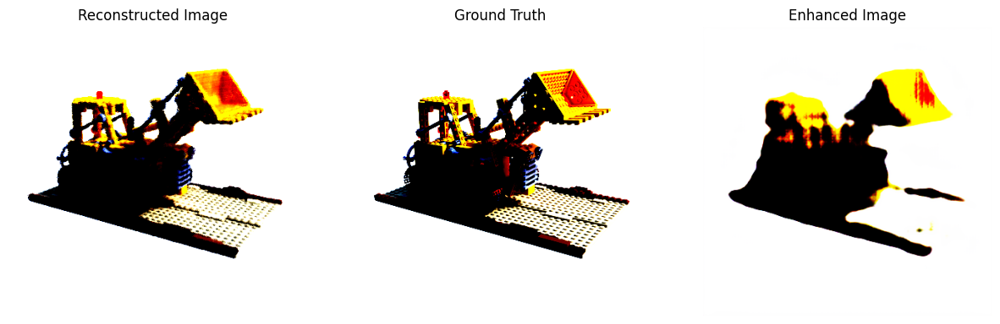

Epoch [1/20], Loss: 37.8567, Avg PSNR: 10.8391, Avg SSIM: 0.4785, Avg LPIPS: 0.4009
Total_loss:  tensor(36.6116, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.1375, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.4968, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.2312, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(37.2306, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 1
Total_loss:  tensor(37.8264, device='cuda:0')
(4, 3, 400, 400)
Epoch [2/20], Loss: 37.8264, Avg PSNR: 10.8270, Avg SSIM: 0.4778, Avg LPIPS: 0.3970
Total_loss:  tensor(36.7259, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.4215, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.2554, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.1058, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(37.0079, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 2
Total_loss:  tensor(37.6994, device='cuda:0')
(4, 3, 

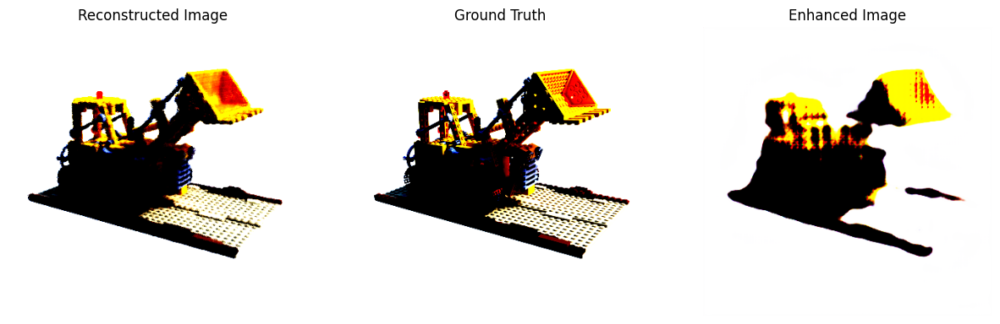

Epoch [6/20], Loss: 37.6405, Avg PSNR: 10.8329, Avg SSIM: 0.4773, Avg LPIPS: 0.3912
Total_loss:  tensor(36.4110, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(35.7496, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(36.0933, device='cuda:0', grad_fn=<AddBackward0>)


KeyboardInterrupt: 

In [ ]:


criterion = CustomLoss(mse_weight=1, frequency_weight = 0.0001,glcm_weight=10)
# criterion = HighFrequencyEmphasisLoss(mse_weight=1.0,gdl_weight = 2, frequency_weight= 0.000001)
optimizer = torch.optim.Adam(model.decoder.parameters(), lr=8e-5)  # Only optimize decoder parameters

num_epochs = 20  # Define the number of epochs
for epoch in range(num_epochs):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # print(f"Inputs type: {inputs.type()}, device: {inputs.device}")
        # print(f"Labels type: {labels.type()}, device: {labels.device}")
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    #print("Validation Loop Now")
    # Validation Loop
    print(f"Epoch {epoch}")
    one_output = None
    model.eval()

    # Metrics storage for the current epoch
    epoch_psnr = []
    epoch_ssim = []
    epoch_lpips = []


    with torch.no_grad():
        total_loss = 0
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Convert tensors to numpy arrays for SSIM and PSNR calculations
            outputs_np = outputs.cpu().detach().numpy()
            labels_np = labels.cpu().detach().numpy()

            print(labels_np.shape)

            # Compute PSNR and SSIM for each image in the batch and LPIPS
            batch_psnr = [psnr(labels_np[i], outputs_np[i], data_range=labels_np[i].max() - labels_np[i].min()) for i in range(outputs_np.shape[0])]
            batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]
            batch_lpips = [lpips_fn(outputs[i:i+1], labels[i:i+1]).item() for i in range(outputs.shape[0])]

            epoch_psnr.extend(batch_psnr)
            epoch_ssim.extend(batch_ssim)
            epoch_lpips.extend(batch_lpips)

            # epoch_psnr.extend(batch_psnr)
            # epoch_ssim.extend(batch_ssim)
            # epoch_lpips.extend(batch_lpips)



            if epoch%5 == 0:
                # Display the output of one validation image
                one_output = outputs[0]  # Select the first image in the batch
                one_input = inputs[0]
                one_label = labels[0]

                display_images(one_input,one_label,one_output)





        # Calculate average metrics for the epoch
        avg_loss = total_loss / len(val_loader)
        avg_psnr = sum(epoch_psnr) / len(epoch_psnr)
        avg_ssim = sum(epoch_ssim) / len(epoch_ssim)
        avg_lpips = sum(epoch_lpips) / len(epoch_lpips)

        median_psnr = np.median(epoch_psnr)
        median_ssim = np.median(epoch_ssim)
        median_lpips = np.median(epoch_lpips)

        min_psnr = np.min(epoch_psnr)
        min_ssim = np.min(epoch_ssim)
        min_lpips = np.min(epoch_lpips)

        max_psnr = np.max(epoch_psnr)
        max_ssim = np.max(epoch_ssim)
        max_lpips = np.max(epoch_lpips)






        # Store metrics
        psnr_values.append([avg_psnr,median_psnr,min_psnr,max_psnr])
        ssim_values.append([avg_ssim,median_ssim,min_ssim,max_ssim])
        lpips_values.append([avg_lpips,median_lpips,min_lpips,max_lpips])

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}, Avg LPIPS: {avg_lpips:.4f}')


# Testing and evaluation would follow similarly

Total_loss:  tensor(10.4227, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.0938, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.2807, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.3751, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.0671, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 0
Total_loss:  tensor(11.0395, device='cuda:0')
(4, 3, 400, 400)


<ipython-input-47-270fbe731585>:46: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]


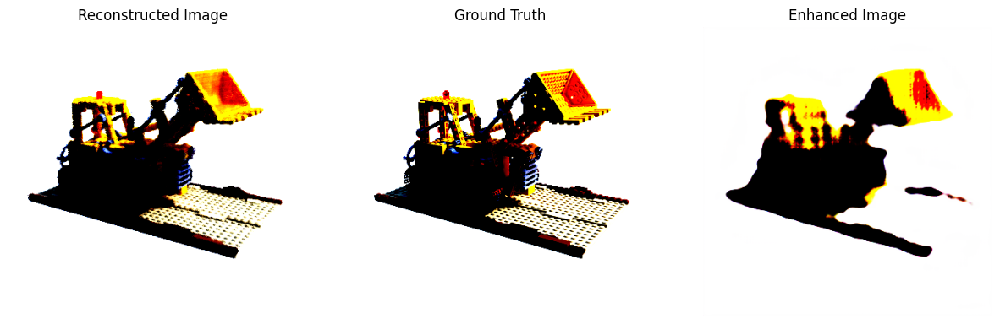

Epoch [1/10], Loss: 11.0395, Avg PSNR: 10.8451, Avg SSIM: 0.4791, Avg LPIPS: 0.3921
Total_loss:  tensor(10.2672, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.1469, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.0611, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.2185, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.2881, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 1
Total_loss:  tensor(10.9872, device='cuda:0')
(4, 3, 400, 400)
Epoch [2/10], Loss: 10.9872, Avg PSNR: 10.8473, Avg SSIM: 0.4805, Avg LPIPS: 0.3927
Total_loss:  tensor(10.1328, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.0903, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.1079, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.1286, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.3634, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 2
Total_loss:  tensor(10.9816, device='cuda:0')
(4, 3, 

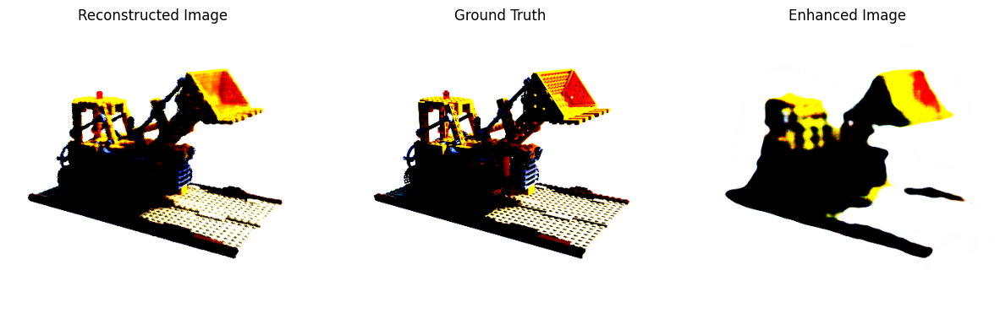

Epoch [6/10], Loss: 10.9693, Avg PSNR: 10.8540, Avg SSIM: 0.4807, Avg LPIPS: 0.3951
Total_loss:  tensor(10.2029, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.1083, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(9.9240, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(9.9942, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.0558, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 6
Total_loss:  tensor(10.9618, device='cuda:0')
(4, 3, 400, 400)
Epoch [7/10], Loss: 10.9618, Avg PSNR: 10.8534, Avg SSIM: 0.4813, Avg LPIPS: 0.3950
Total_loss:  tensor(10.0166, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(9.9749, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.0261, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.1095, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(10.2930, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 7
Total_loss:  tensor(10.9686, device='cuda:0')
(4, 3, 400

In [ ]:


#criterion = CustomLoss(mse_weight=2, frequency_weight = 0.0000001,glcm_weight=0.2)
criterion = HighFrequencyEmphasisLoss(mse_weight=3,gdl_weight = 5, frequency_weight= 0.0000001)
optimizer = torch.optim.Adam(model.decoder.parameters(), lr=8e-5)  # Only optimize decoder parameters

num_epochs = 10  # Define the number of epochs
for epoch in range(num_epochs):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # print(f"Inputs type: {inputs.type()}, device: {inputs.device}")
        # print(f"Labels type: {labels.type()}, device: {labels.device}")
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    #print("Validation Loop Now")
    # Validation Loop
    print(f"Epoch {epoch}")
    one_output = None
    model.eval()

    # Metrics storage for the current epoch
    epoch_psnr = []
    epoch_ssim = []
    epoch_lpips = []


    with torch.no_grad():
        total_loss = 0
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Convert tensors to numpy arrays for SSIM and PSNR calculations
            outputs_np = outputs.cpu().detach().numpy()
            labels_np = labels.cpu().detach().numpy()

            print(labels_np.shape)

            # Compute PSNR and SSIM for each image in the batch and LPIPS
            batch_psnr = [psnr(labels_np[i], outputs_np[i], data_range=labels_np[i].max() - labels_np[i].min()) for i in range(outputs_np.shape[0])]
            batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]
            batch_lpips = [lpips_fn(outputs[i:i+1], labels[i:i+1]).item() for i in range(outputs.shape[0])]

            epoch_psnr.extend(batch_psnr)
            epoch_ssim.extend(batch_ssim)
            epoch_lpips.extend(batch_lpips)

            # epoch_psnr.extend(batch_psnr)
            # epoch_ssim.extend(batch_ssim)
            # epoch_lpips.extend(batch_lpips)



            if epoch%5 == 0:
                # Display the output of one validation image
                one_output = outputs[0]  # Select the first image in the batch
                one_input = inputs[0]
                one_label = labels[0]

                display_images(one_input,one_label,one_output)





        # Calculate average metrics for the epoch
        avg_loss = total_loss / len(val_loader)
        avg_psnr = sum(epoch_psnr) / len(epoch_psnr)
        avg_ssim = sum(epoch_ssim) / len(epoch_ssim)
        avg_lpips = sum(epoch_lpips) / len(epoch_lpips)

        median_psnr = np.median(epoch_psnr)
        median_ssim = np.median(epoch_ssim)
        median_lpips = np.median(epoch_lpips)

        min_psnr = np.min(epoch_psnr)
        min_ssim = np.min(epoch_ssim)
        min_lpips = np.min(epoch_lpips)

        max_psnr = np.max(epoch_psnr)
        max_ssim = np.max(epoch_ssim)
        max_lpips = np.max(epoch_lpips)






        # Store metrics
        psnr_values.append([avg_psnr,median_psnr,min_psnr,max_psnr])
        ssim_values.append([avg_ssim,median_ssim,min_ssim,max_ssim])
        lpips_values.append([avg_lpips,median_lpips,min_lpips,max_lpips])

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}, Avg LPIPS: {avg_lpips:.4f}')


# Testing and evaluation would follow similarly

Total_loss:  tensor(2.4995, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5044, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5455, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5203, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.6002, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 0
Total_loss:  tensor(2.7132, device='cuda:0')
(4, 3, 400, 400)


<ipython-input-50-70a84987dbac>:46: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]


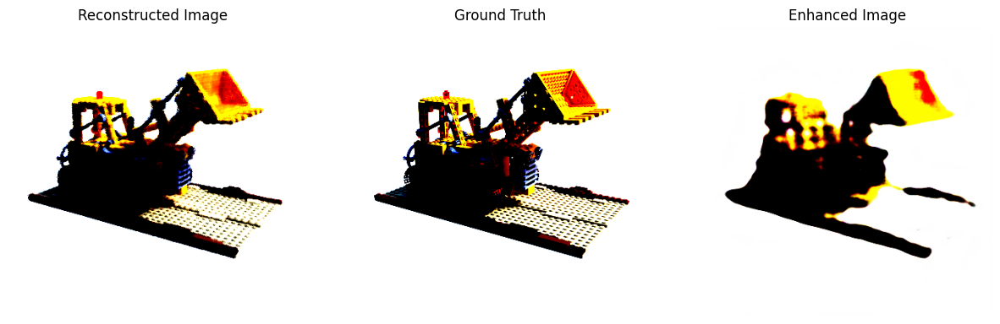

Epoch [1/20], Loss: 2.7132, Avg PSNR: 10.8483, Avg SSIM: 0.4798, Avg LPIPS: 0.3890
Total_loss:  tensor(2.5259, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5409, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5160, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5142, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4185, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 1
Total_loss:  tensor(2.7193, device='cuda:0')
(4, 3, 400, 400)
Epoch [2/20], Loss: 2.7193, Avg PSNR: 10.8514, Avg SSIM: 0.4804, Avg LPIPS: 0.3934
Total_loss:  tensor(2.5252, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5046, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5475, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5505, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4071, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 2
Total_loss:  tensor(2.7115, device='cuda:0')
(4, 3, 400, 400)
Epoc

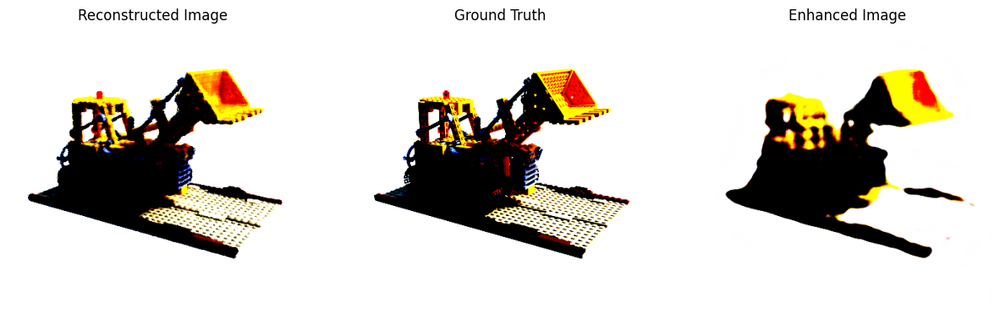

Epoch [6/20], Loss: 2.7126, Avg PSNR: 10.8550, Avg SSIM: 0.4807, Avg LPIPS: 0.3903
Total_loss:  tensor(2.4525, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5204, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5622, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4997, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5698, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 6
Total_loss:  tensor(2.7095, device='cuda:0')
(4, 3, 400, 400)
Epoch [7/20], Loss: 2.7095, Avg PSNR: 10.8572, Avg SSIM: 0.4813, Avg LPIPS: 0.3900
Total_loss:  tensor(2.4922, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5456, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4555, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5708, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4392, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 7
Total_loss:  tensor(2.7123, device='cuda:0')
(4, 3, 400, 400)
Epoc

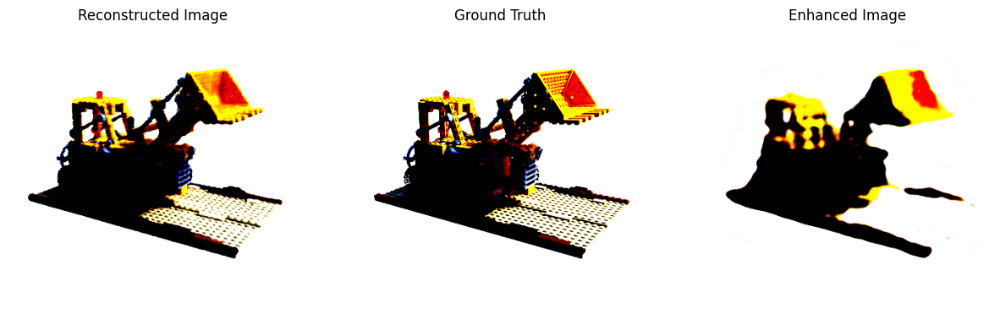

Epoch [11/20], Loss: 2.7087, Avg PSNR: 10.8554, Avg SSIM: 0.4810, Avg LPIPS: 0.3896
Total_loss:  tensor(2.4333, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.6684, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5355, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.3727, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5605, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 11
Total_loss:  tensor(2.7082, device='cuda:0')
(4, 3, 400, 400)
Epoch [12/20], Loss: 2.7082, Avg PSNR: 10.8569, Avg SSIM: 0.4810, Avg LPIPS: 0.3877
Total_loss:  tensor(2.4202, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4884, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5028, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4966, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.8721, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 12
Total_loss:  tensor(2.7065, device='cuda:0')
(4, 3, 400, 400)


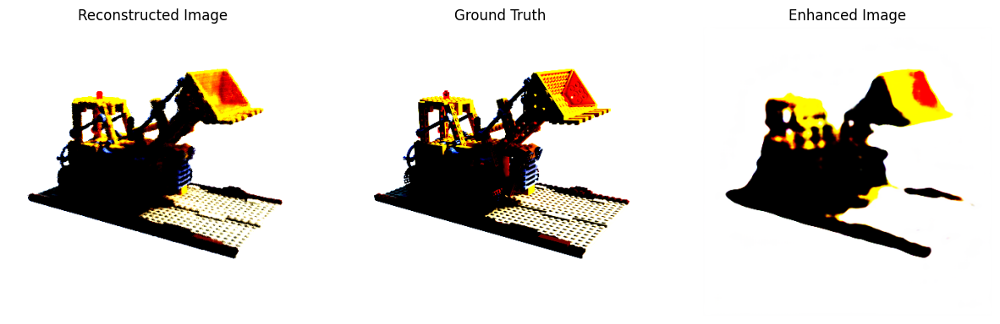

Epoch [16/20], Loss: 2.7079, Avg PSNR: 10.8545, Avg SSIM: 0.4807, Avg LPIPS: 0.3879
Total_loss:  tensor(2.4147, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5485, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.6081, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4498, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4261, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 16
Total_loss:  tensor(2.7062, device='cuda:0')
(4, 3, 400, 400)
Epoch [17/20], Loss: 2.7062, Avg PSNR: 10.8550, Avg SSIM: 0.4807, Avg LPIPS: 0.3870
Total_loss:  tensor(2.4925, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.4420, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5107, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.5027, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(2.6580, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 17
Total_loss:  tensor(2.7047, device='cuda:0')
(4, 3, 400, 400)


In [ ]:


criterion = CustomLoss(mse_weight=0.5, frequency_weight = 0.000001,glcm_weight=2)
#criterion = HighFrequencyEmphasisLoss(mse_weight=3.0,gdl_weight = 2, frequency_weight= 0.0000000)
optimizer = torch.optim.Adam(model.decoder.parameters(), lr=8e-5)  # Only optimize decoder parameters

num_epochs = 20  # Define the number of epochs
for epoch in range(num_epochs):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # print(f"Inputs type: {inputs.type()}, device: {inputs.device}")
        # print(f"Labels type: {labels.type()}, device: {labels.device}")
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    #print("Validation Loop Now")
    # Validation Loop
    print(f"Epoch {epoch}")
    one_output = None
    model.eval()

    # Metrics storage for the current epoch
    epoch_psnr = []
    epoch_ssim = []
    epoch_lpips = []


    with torch.no_grad():
        total_loss = 0
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Convert tensors to numpy arrays for SSIM and PSNR calculations
            outputs_np = outputs.cpu().detach().numpy()
            labels_np = labels.cpu().detach().numpy()

            print(labels_np.shape)

            # Compute PSNR and SSIM for each image in the batch and LPIPS
            batch_psnr = [psnr(labels_np[i], outputs_np[i], data_range=labels_np[i].max() - labels_np[i].min()) for i in range(outputs_np.shape[0])]
            batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]
            batch_lpips = [lpips_fn(outputs[i:i+1], labels[i:i+1]).item() for i in range(outputs.shape[0])]

            epoch_psnr.extend(batch_psnr)
            epoch_ssim.extend(batch_ssim)
            epoch_lpips.extend(batch_lpips)

            # epoch_psnr.extend(batch_psnr)
            # epoch_ssim.extend(batch_ssim)
            # epoch_lpips.extend(batch_lpips)



            if epoch%5 == 0:
                # Display the output of one validation image
                one_output = outputs[0]  # Select the first image in the batch
                one_input = inputs[0]
                one_label = labels[0]

                display_images(one_input,one_label,one_output)





        # Calculate average metrics for the epoch
        avg_loss = total_loss / len(val_loader)
        avg_psnr = sum(epoch_psnr) / len(epoch_psnr)
        avg_ssim = sum(epoch_ssim) / len(epoch_ssim)
        avg_lpips = sum(epoch_lpips) / len(epoch_lpips)

        median_psnr = np.median(epoch_psnr)
        median_ssim = np.median(epoch_ssim)
        median_lpips = np.median(epoch_lpips)

        min_psnr = np.min(epoch_psnr)
        min_ssim = np.min(epoch_ssim)
        min_lpips = np.min(epoch_lpips)

        max_psnr = np.max(epoch_psnr)
        max_ssim = np.max(epoch_ssim)
        max_lpips = np.max(epoch_lpips)






        # Store metrics
        psnr_values.append([avg_psnr,median_psnr,min_psnr,max_psnr])
        ssim_values.append([avg_ssim,median_ssim,min_ssim,max_ssim])
        lpips_values.append([avg_lpips,median_lpips,min_lpips,max_lpips])

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}, Avg LPIPS: {avg_lpips:.4f}')


# Testing and evaluation would follow similarly

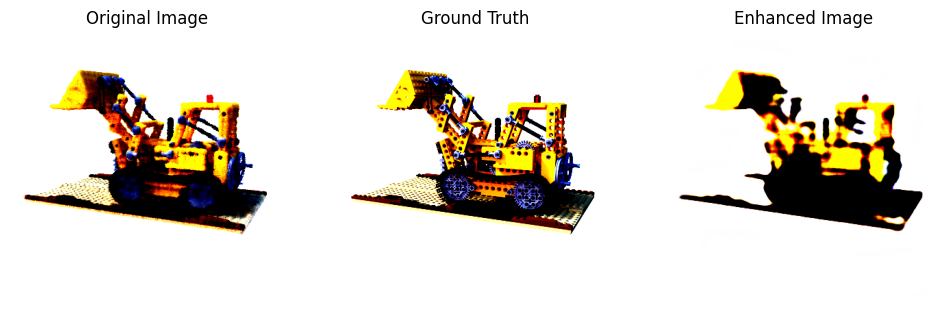

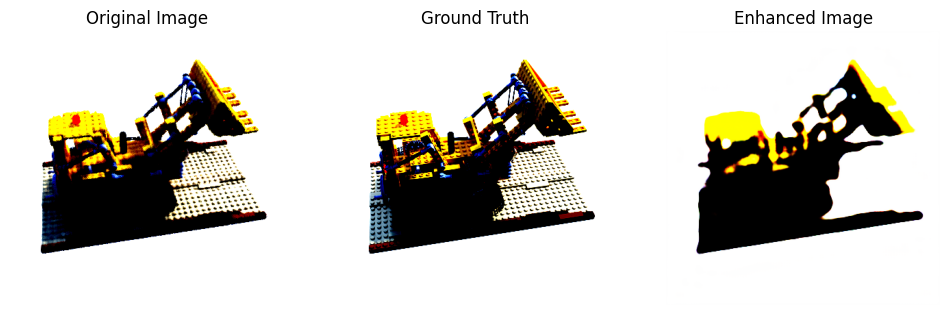

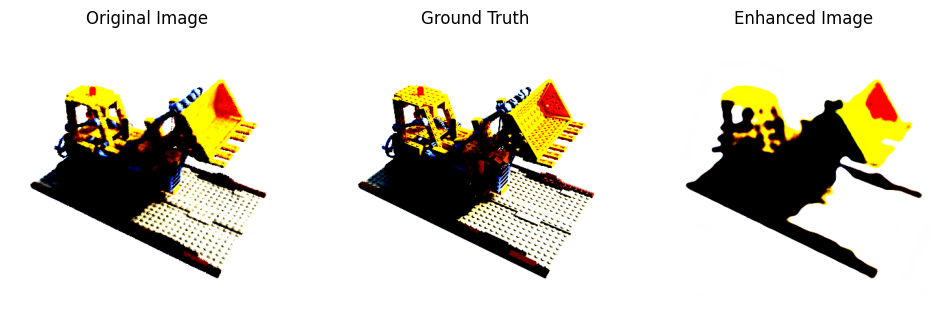

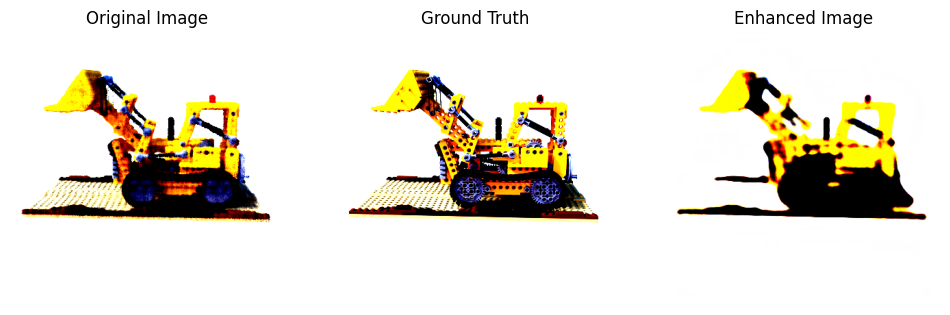

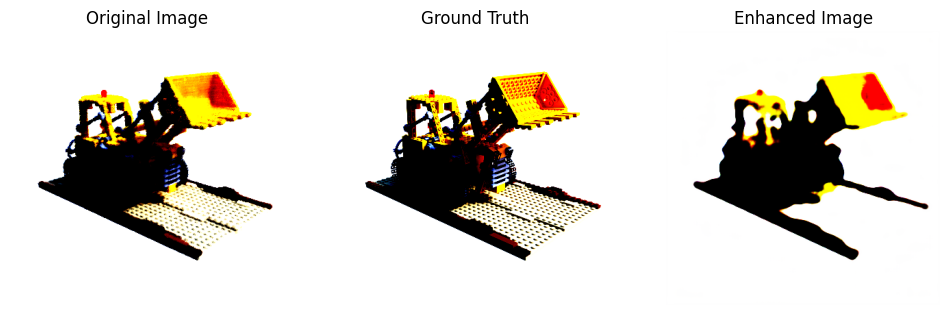

In [ ]:
import matplotlib.pyplot as plt

def visualize_comparisons(model, test_loader, num_images=5):
    model.eval()
    images_processed = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            outputs = outputs.cpu()
            inputs = inputs.cpu()
            labels = labels.cpu()


            for i in range(inputs.size(0)):
                if images_processed >= num_images:
                    return

                plt.figure(figsize=(12, 4))

                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(inputs[i].permute(1, 2, 0))
                plt.title("Original Image")
                plt.axis('off')

                # Ground Truth
                plt.subplot(1, 3, 2)
                plt.imshow(labels[i].permute(1, 2, 0))
                plt.title("Ground Truth")
                plt.axis('off')

                # Enhanced Image
                plt.subplot(1, 3, 3)
                plt.imshow(outputs[i].permute(1, 2, 0))
                plt.title("Enhanced Image")
                plt.axis('off')

                plt.show()

                images_processed += 1

visualize_comparisons(model, train_loader, num_images=5)

In [ ]:


criterion = CustomLoss(mse_weight=0.1, frequency_weight = 0.000002,glcm_weight=1.0)
#criterion = HighFrequencyEmphasisLoss(mse_weight=1.0,gdl_weight = 2, frequency_weight= 0.000001)
optimizer = torch.optim.Adam(model.decoder.parameters(), lr=1e-4)  # Only optimize decoder parameters

num_epochs = 100  # Define the number of epochs
for epoch in range(num_epochs):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # print(f"Inputs type: {inputs.type()}, device: {inputs.device}")
        # print(f"Labels type: {labels.type()}, device: {labels.device}")
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    #print("Validation Loop Now")
    # Validation Loop
    print(f"Epoch {epoch}")
    one_output = None
    model.eval()

    # Metrics storage for the current epoch
    epoch_psnr = []
    epoch_ssim = []
    epoch_lpips = []


    with torch.no_grad():
        total_loss = 0
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Convert tensors to numpy arrays for SSIM and PSNR calculations
            outputs_np = outputs.cpu().detach().numpy()
            labels_np = labels.cpu().detach().numpy()

            print(labels_np.shape)

            # Compute PSNR and SSIM for each image in the batch and LPIPS
            batch_psnr = [psnr(labels_np[i], outputs_np[i], data_range=labels_np[i].max() - labels_np[i].min()) for i in range(outputs_np.shape[0])]
            batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]
            batch_lpips = [lpips_fn(outputs[i:i+1], labels[i:i+1]).item() for i in range(outputs.shape[0])]

            epoch_psnr.extend(batch_psnr)
            epoch_ssim.extend(batch_ssim)
            epoch_lpips.extend(batch_lpips)



            if epoch%5 == 0:
                # Display the output of one validation image
                one_output = outputs[0]  # Select the first image in the batch
                one_input = inputs[0]
                one_label = labels[0]

                display_images(one_input,one_label,one_output)





        # Calculate average metrics for the epoch
        avg_loss = total_loss / len(val_loader)
        avg_psnr = sum(epoch_psnr) / len(epoch_psnr)
        avg_ssim = sum(epoch_ssim) / len(epoch_ssim)
        avg_lpips = sum(epoch_lpips) / len(epoch_lpips)

        # Store metrics
        psnr_values.append(avg_psnr)
        ssim_values.append(avg_ssim)
        lpips_values.append(avg_lpips)

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}, Avg LPIPS: {avg_lpips:.4f}')


# Testing and evaluation would follow similarly

Output hidden; open in https://colab.research.google.com to view.

Total_loss:  tensor(1.9943, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9719, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9975, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9921, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9673, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9614, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9558, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9893, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9633, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 0
Total_loss:  tensor(1.9688, device='cuda:0')
(4, 3, 400, 400)


<ipython-input-70-0d4b1b53c2f6>:46: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]


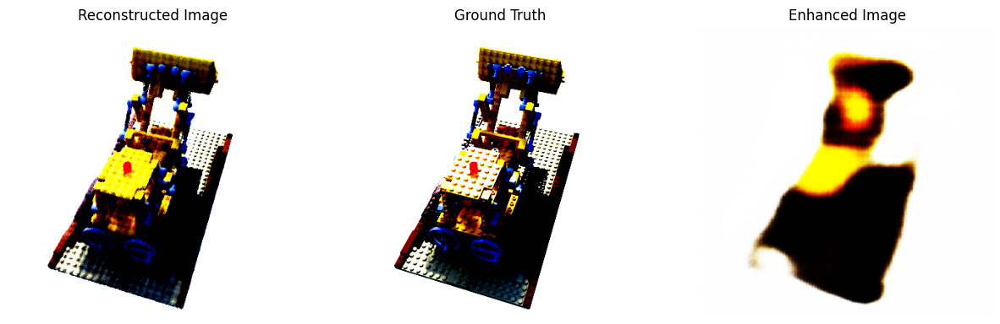

Epoch [1/100], Loss: 1.9688, Avg PSNR: 10.9200, Avg SSIM: 0.4571, Avg LPIPS: 0.4802
Total_loss:  tensor(1.9915, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9588, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9558, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9483, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9502, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9808, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9770, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9772, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9936, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 1
Total_loss:  tensor(1.9660, device='cuda:0')
(4, 3, 400, 400)
Epoch [2/100], Loss: 1.9660, Avg PSNR: 10.9264, Avg SSIM: 0.4574, Avg LPIPS: 0.4776
Total_loss:  tensor(1.9796, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9776, device='cuda:0', grad_fn=<AddBackward0>)
Tot

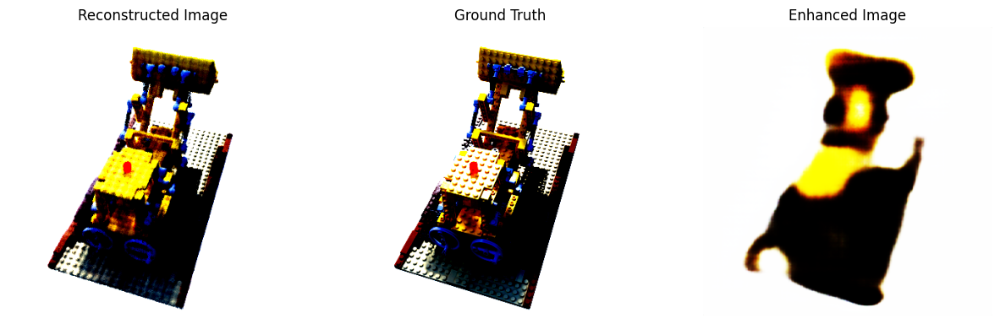

Epoch [6/100], Loss: 1.9524, Avg PSNR: 10.9571, Avg SSIM: 0.4603, Avg LPIPS: 0.4564
Total_loss:  tensor(1.9587, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9664, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9543, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9420, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9413, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9524, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9144, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9382, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9431, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 6
Total_loss:  tensor(1.9511, device='cuda:0')
(4, 3, 400, 400)
Epoch [7/100], Loss: 1.9511, Avg PSNR: 10.9603, Avg SSIM: 0.4600, Avg LPIPS: 0.4541
Total_loss:  tensor(1.9379, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9516, device='cuda:0', grad_fn=<AddBackward0>)
Tot

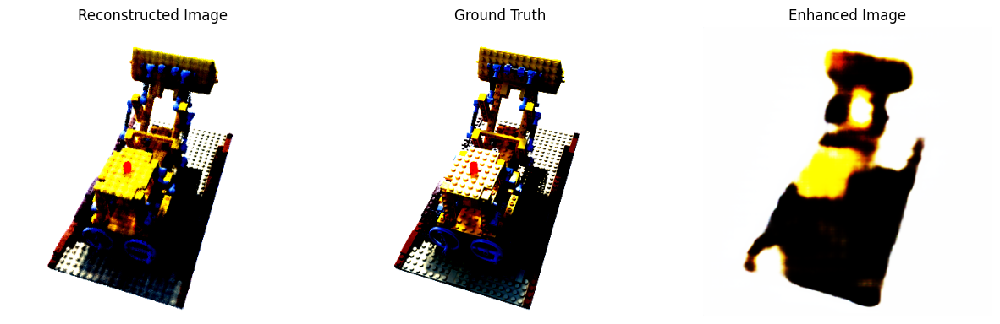

Epoch [11/100], Loss: 1.9399, Avg PSNR: 10.9865, Avg SSIM: 0.4617, Avg LPIPS: 0.4405
Total_loss:  tensor(1.9441, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9207, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9171, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9227, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9402, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9388, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9327, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9254, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9477, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 11
Total_loss:  tensor(1.9371, device='cuda:0')
(4, 3, 400, 400)
Epoch [12/100], Loss: 1.9371, Avg PSNR: 10.9926, Avg SSIM: 0.4624, Avg LPIPS: 0.4380
Total_loss:  tensor(1.9320, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9185, device='cuda:0', grad_fn=<AddBackward0>)


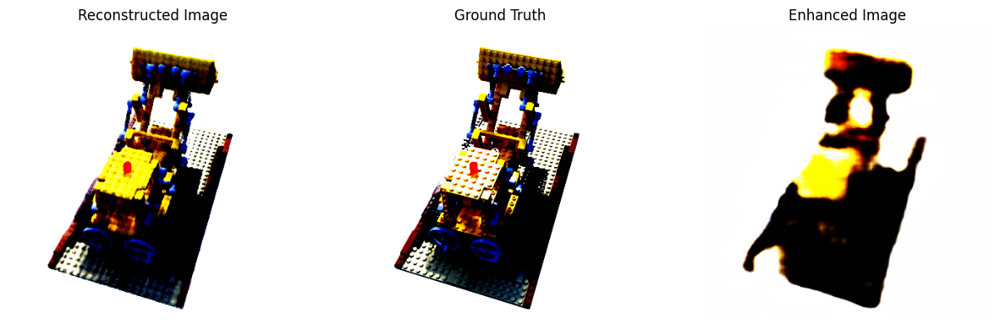

Epoch [16/100], Loss: 1.9349, Avg PSNR: 10.9976, Avg SSIM: 0.4629, Avg LPIPS: 0.4268
Total_loss:  tensor(1.9138, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9291, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9459, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9278, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9027, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9205, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9109, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9254, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9174, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 16
Total_loss:  tensor(1.9341, device='cuda:0')
(4, 3, 400, 400)
Epoch [17/100], Loss: 1.9341, Avg PSNR: 10.9996, Avg SSIM: 0.4632, Avg LPIPS: 0.4282
Total_loss:  tensor(1.9298, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9086, device='cuda:0', grad_fn=<AddBackward0>)


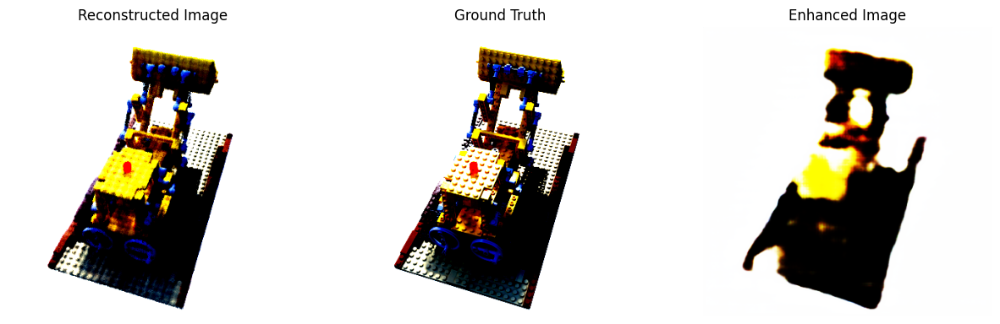

Epoch [21/100], Loss: 1.9330, Avg PSNR: 11.0016, Avg SSIM: 0.4637, Avg LPIPS: 0.4207
Total_loss:  tensor(1.9256, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.8864, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9283, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9162, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.8994, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9080, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9322, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9099, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9307, device='cuda:0', grad_fn=<AddBackward0>)
Epoch 21
Total_loss:  tensor(1.9329, device='cuda:0')
(4, 3, 400, 400)
Epoch [22/100], Loss: 1.9329, Avg PSNR: 11.0017, Avg SSIM: 0.4639, Avg LPIPS: 0.4170
Total_loss:  tensor(1.8985, device='cuda:0', grad_fn=<AddBackward0>)
Total_loss:  tensor(1.9207, device='cuda:0', grad_fn=<AddBackward0>)


KeyboardInterrupt: 

In [ ]:


criterion = CustomLoss(mse_weight=1, frequency_weight = 0.00001,glcm_weight=0)
#criterion = HighFrequencyEmphasisLoss(mse_weight=1,gdl_weight = 0.1, frequency_weight= 0.0000001)
optimizer = torch.optim.Adam(model.decoder.parameters(), lr=1e-4)  # Only optimize decoder parameters

num_epochs = 100  # Define the number of epochs
for epoch in range(num_epochs):
    model.train()
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        # print(f"Inputs type: {inputs.type()}, device: {inputs.device}")
        # print(f"Labels type: {labels.type()}, device: {labels.device}")
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    #print("Validation Loop Now")
    # Validation Loop
    print(f"Epoch {epoch}")
    one_output = None
    model.eval()

    # Metrics storage for the current epoch
    epoch_psnr = []
    epoch_ssim = []
    epoch_lpips = []


    with torch.no_grad():
        total_loss = 0
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            # Convert tensors to numpy arrays for SSIM and PSNR calculations
            outputs_np = outputs.cpu().detach().numpy()
            labels_np = labels.cpu().detach().numpy()

            print(labels_np.shape)

            # Compute PSNR and SSIM for each image in the batch and LPIPS
            batch_psnr = [psnr(labels_np[i], outputs_np[i], data_range=labels_np[i].max() - labels_np[i].min()) for i in range(outputs_np.shape[0])]
            batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]
            batch_lpips = [lpips_fn(outputs[i:i+1], labels[i:i+1]).item() for i in range(outputs.shape[0])]

            epoch_psnr.extend(batch_psnr)
            epoch_ssim.extend(batch_ssim)
            epoch_lpips.extend(batch_lpips)



            if epoch%5 == 0:
                # Display the output of one validation image
                one_output = outputs[0]  # Select the first image in the batch
                one_input = inputs[0]
                one_label = labels[0]

                display_images(one_input,one_label,one_output)





        # Calculate average metrics for the epoch
        avg_loss = total_loss / len(val_loader)
        avg_psnr = sum(epoch_psnr) / len(epoch_psnr)
        avg_ssim = sum(epoch_ssim) / len(epoch_ssim)
        avg_lpips = sum(epoch_lpips) / len(epoch_lpips)

        # Store metrics
        psnr_values.append(avg_psnr)
        ssim_values.append(avg_ssim)
        lpips_values.append(avg_lpips)

        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}, Avg LPIPS: {avg_lpips:.4f}')


# Testing and evaluation would follow similarly

In [ ]:
from skimage.metrics import structural_similarity as ssim
import numpy as np

def evaluate_model(model, test_loader):
    model.eval()
    total_mse, total_ssim = 0, 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            # Calculate MSE
            mse = nn.functional.mse_loss(outputs, labels, reduction='sum').item()
            total_mse += mse

            # Calculate SSIM for each image (requires numpy conversion)
            outputs = outputs.cpu().numpy()
            labels = labels.cpu().numpy()
            batch_ssim = np.mean([ssim(outputs[i].transpose(1, 2, 0), labels[i].transpose(1, 2, 0), multichannel=True)
                                  for i in range(outputs.shape[0])])
            total_ssim += batch_ssim

    avg_mse = total_mse / len(test_loader.dataset)
    avg_ssim = total_ssim / len(test_loader)
    return avg_mse, avg_ssim

avg_mse, avg_ssim = evaluate_model(model, test_loader)
print(f"Average MSE: {avg_mse}, Average SSIM: {avg_ssim}")

Average MSE: 868279.5833333334, Average SSIM: 0.48813924193382263


<ipython-input-25-af2522e4de81>:19: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  batch_ssim = np.mean([ssim(outputs[i].transpose(1, 2, 0), labels[i].transpose(1, 2, 0), multichannel=True)


In [ ]:
from skimage.metrics import structural_similarity as ssim
import numpy as np

def evaluate_model(model, test_loader):
    model.eval()
    total_mse, total_ssim = 0, 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            # Calculate MSE
            mse = nn.functional.mse_loss(outputs, labels, reduction='sum').item()
            total_mse += mse

            # Calculate SSIM for each image (requires numpy conversion)
            outputs = outputs.cpu().numpy()
            labels = labels.cpu().numpy()
            batch_ssim = np.mean([ssim(outputs[i].transpose(1, 2, 0), labels[i].transpose(1, 2, 0), multichannel=True)
                                  for i in range(outputs.shape[0])])
            total_ssim += batch_ssim

    avg_mse = total_mse / len(test_loader.dataset)
    avg_ssim = total_ssim / len(test_loader)
    return avg_mse, avg_ssim

avg_mse, avg_ssim = evaluate_model(model, test_loader)
print(f"Average MSE: {avg_mse}, Average SSIM: {avg_ssim}")

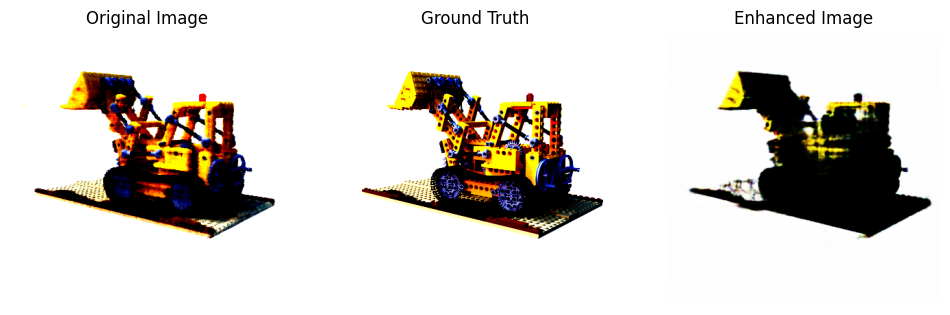

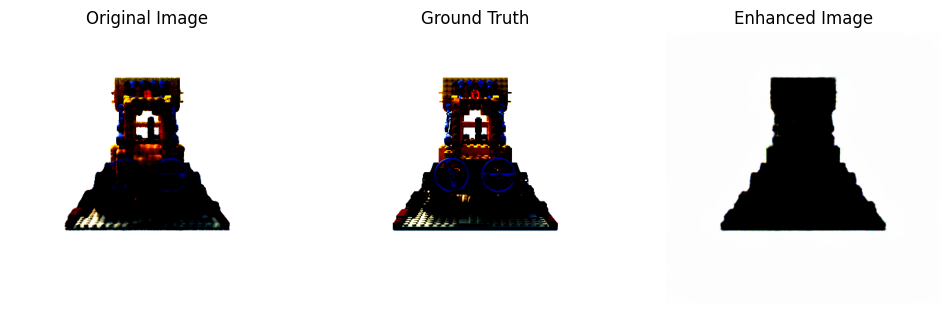

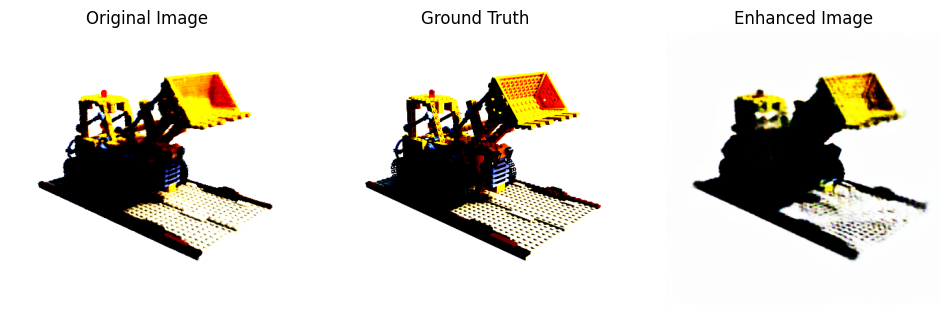

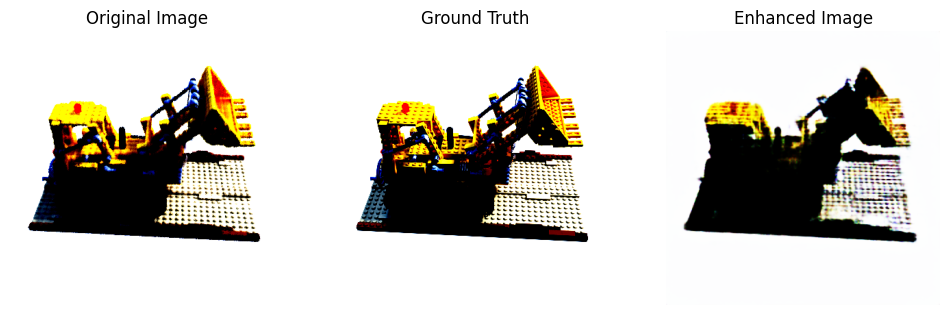

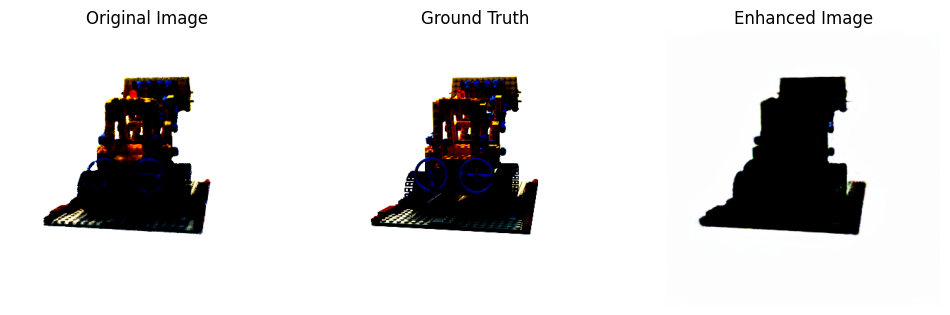

In [ ]:
import matplotlib.pyplot as plt

def visualize_comparisons(model, test_loader, num_images=5):
    model.eval()
    images_processed = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            outputs = outputs.cpu()
            inputs = inputs.cpu()
            labels = labels.cpu()


            for i in range(inputs.size(0)):
                if images_processed >= num_images:
                    return

                plt.figure(figsize=(12, 4))

                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(inputs[i].permute(1, 2, 0))
                plt.title("Original Image")
                plt.axis('off')

                # Ground Truth
                plt.subplot(1, 3, 2)
                plt.imshow(labels[i].permute(1, 2, 0))
                plt.title("Ground Truth")
                plt.axis('off')

                # Enhanced Image
                plt.subplot(1, 3, 3)
                plt.imshow(outputs[i].permute(1, 2, 0))
                plt.title("Enhanced Image")
                plt.axis('off')

                plt.show()

                images_processed += 1

visualize_comparisons(model, train_loader, num_images=5)

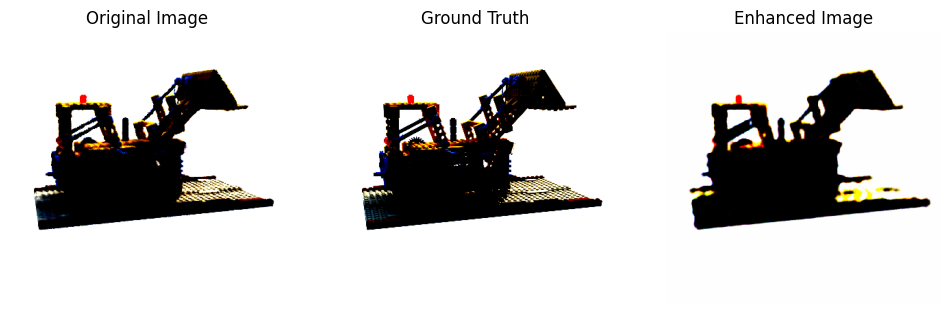

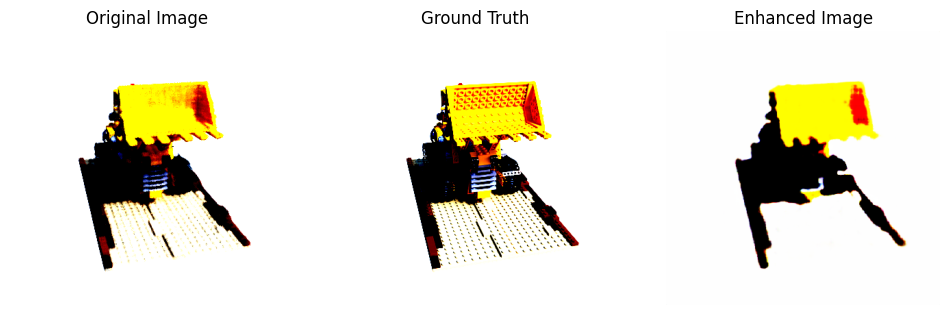

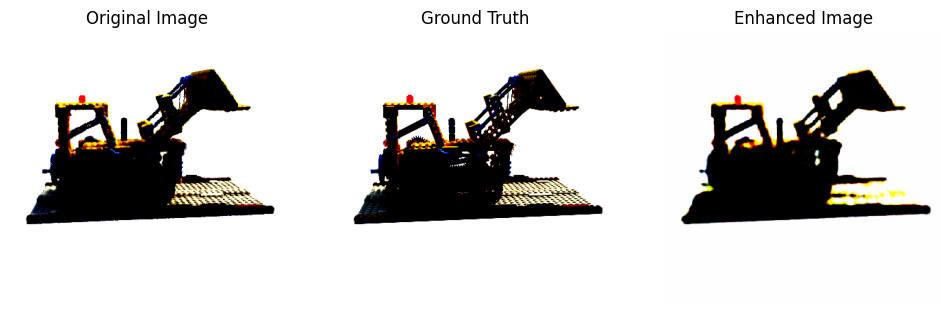

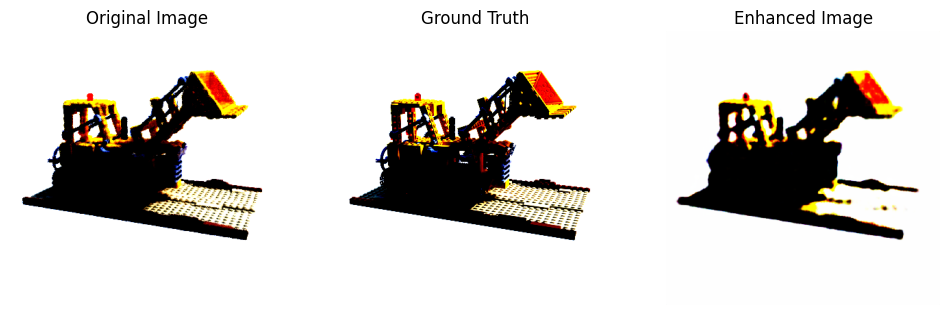

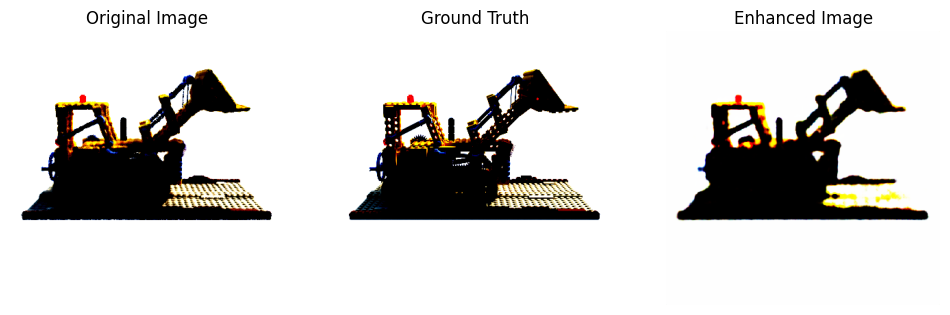

In [ ]:
import matplotlib.pyplot as plt

def visualize_comparisons(model, test_loader, num_images=5):
    model.eval()
    images_processed = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            outputs = outputs.cpu()
            inputs = inputs.cpu()
            labels = labels.cpu()


            for i in range(inputs.size(0)):
                if images_processed >= num_images:
                    return

                plt.figure(figsize=(12, 4))

                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(inputs[i].permute(1, 2, 0))
                plt.title("Original Image")
                plt.axis('off')

                # Ground Truth
                plt.subplot(1, 3, 2)
                plt.imshow(labels[i].permute(1, 2, 0))
                plt.title("Ground Truth")
                plt.axis('off')

                # Enhanced Image
                plt.subplot(1, 3, 3)
                plt.imshow(outputs[i].permute(1, 2, 0))
                plt.title("Enhanced Image")
                plt.axis('off')

                plt.show()

                images_processed += 1

visualize_comparisons(model, train_loader, num_images=5)

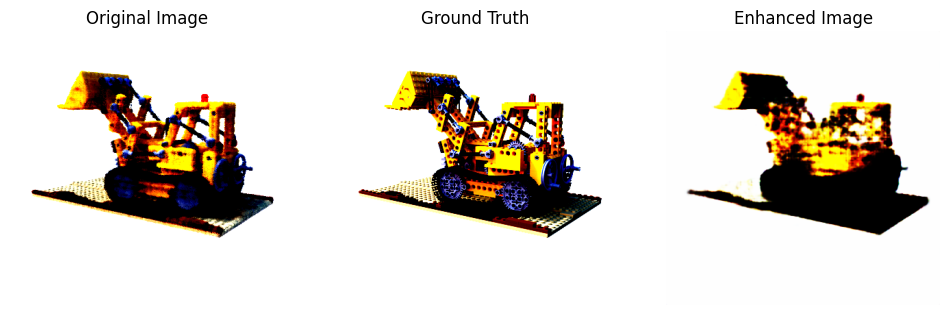

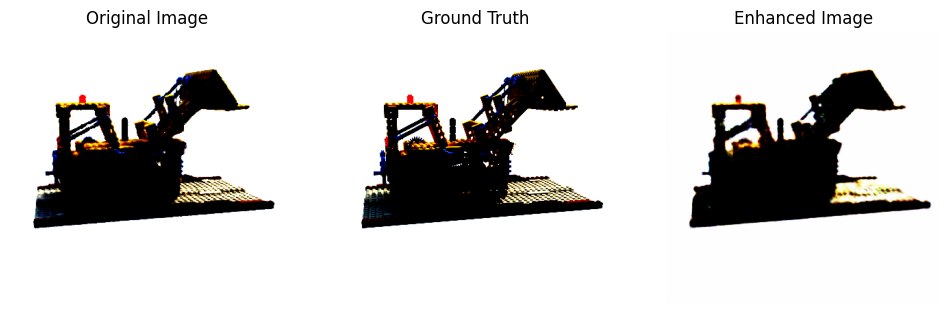

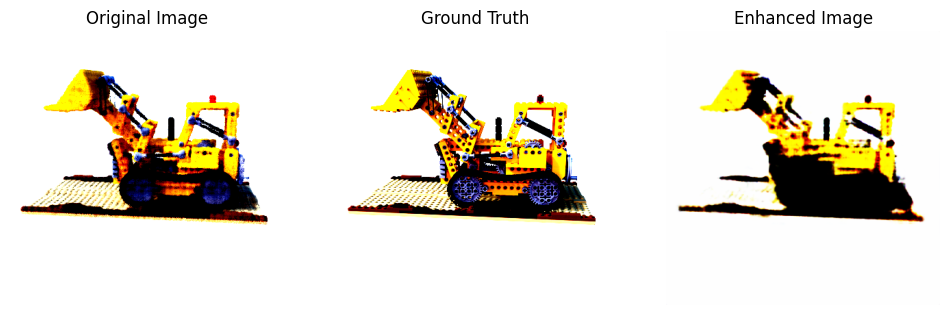

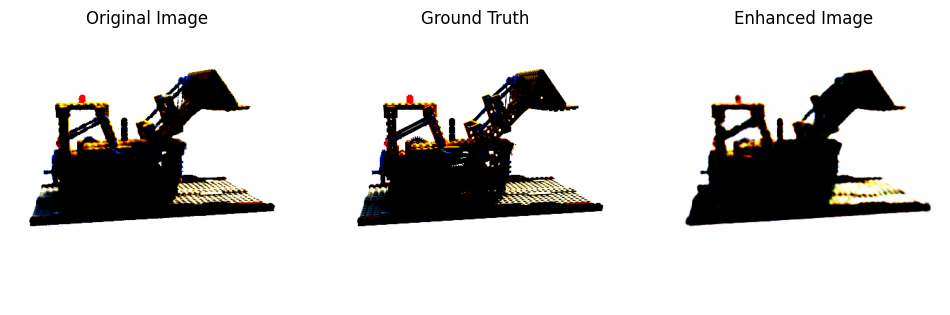

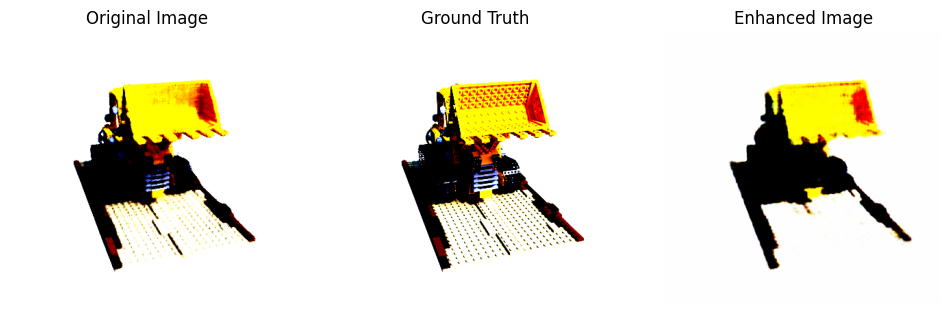

In [ ]:
import matplotlib.pyplot as plt

def visualize_comparisons(model, test_loader, num_images=5):
    model.eval()
    images_processed = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            outputs = outputs.cpu()
            inputs = inputs.cpu()
            labels = labels.cpu()


            for i in range(inputs.size(0)):
                if images_processed >= num_images:
                    return

                plt.figure(figsize=(12, 4))

                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(inputs[i].permute(1, 2, 0))
                plt.title("Original Image")
                plt.axis('off')

                # Ground Truth
                plt.subplot(1, 3, 2)
                plt.imshow(labels[i].permute(1, 2, 0))
                plt.title("Ground Truth")
                plt.axis('off')

                # Enhanced Image
                plt.subplot(1, 3, 3)
                plt.imshow(outputs[i].permute(1, 2, 0))
                plt.title("Enhanced Image")
                plt.axis('off')

                plt.show()

                images_processed += 1

visualize_comparisons(model, train_loader, num_images=5)

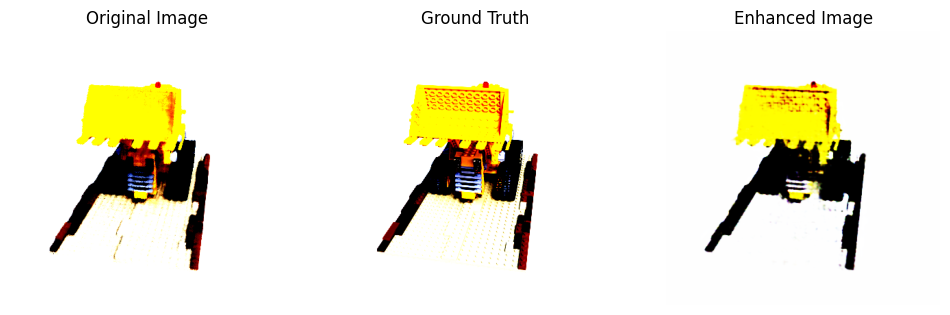

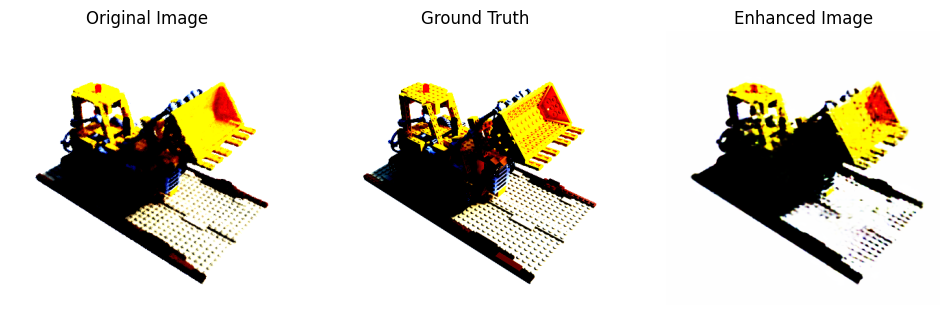

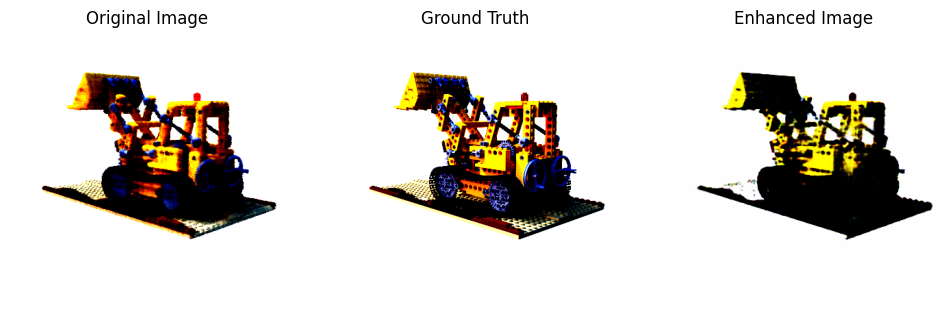

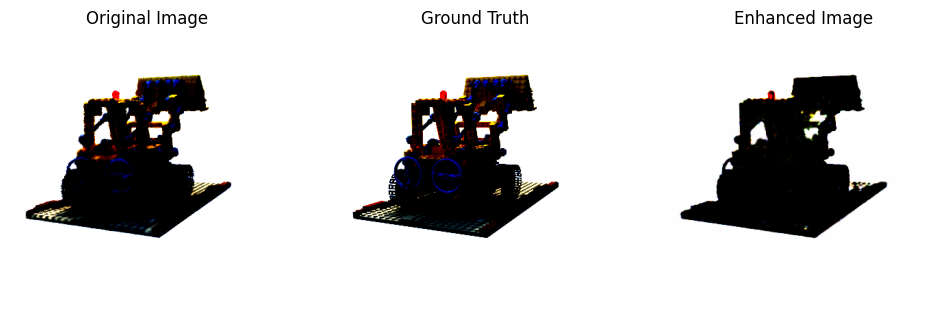

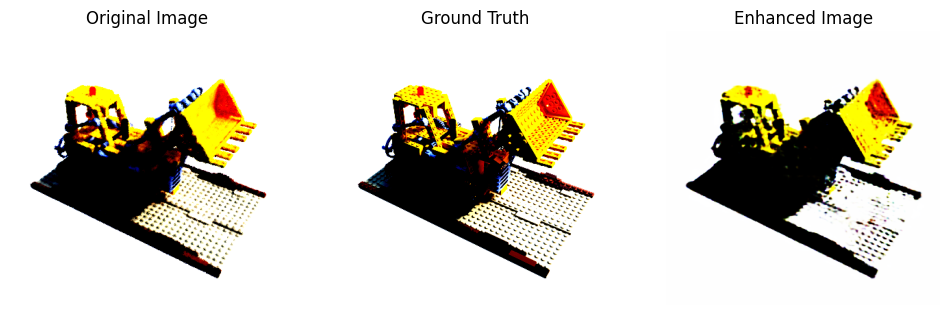

In [ ]:
import matplotlib.pyplot as plt

def visualize_comparisons(model, test_loader, num_images=5):
    model.eval()
    images_processed = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            outputs = outputs.cpu()
            inputs = inputs.cpu()
            labels = labels.cpu()


            for i in range(inputs.size(0)):
                if images_processed >= num_images:
                    return

                plt.figure(figsize=(12, 4))

                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(inputs[i].permute(1, 2, 0))
                plt.title("Original Image")
                plt.axis('off')

                # Ground Truth
                plt.subplot(1, 3, 2)
                plt.imshow(labels[i].permute(1, 2, 0))
                plt.title("Ground Truth")
                plt.axis('off')

                # Enhanced Image
                plt.subplot(1, 3, 3)
                plt.imshow(outputs[i].permute(1, 2, 0))
                plt.title("Enhanced Image")
                plt.axis('off')

                plt.show()

                images_processed += 1

visualize_comparisons(model, train_loader, num_images=5)

New Eval

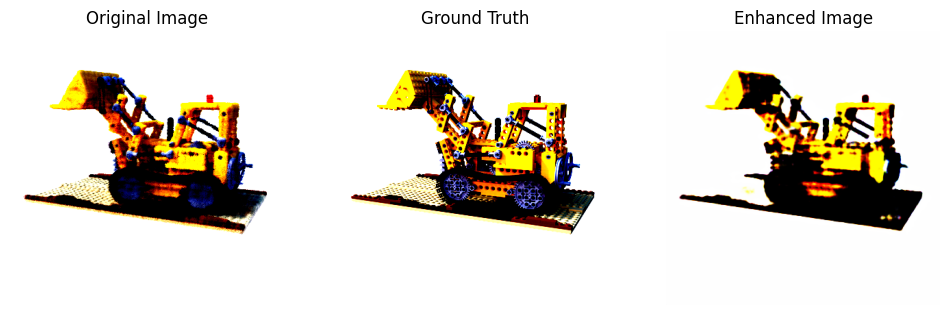

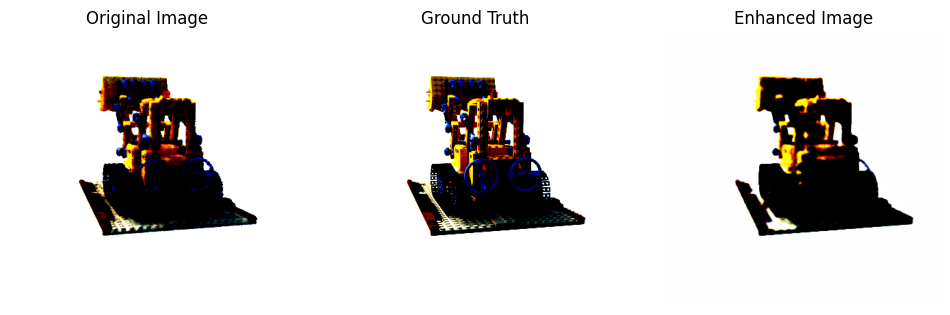

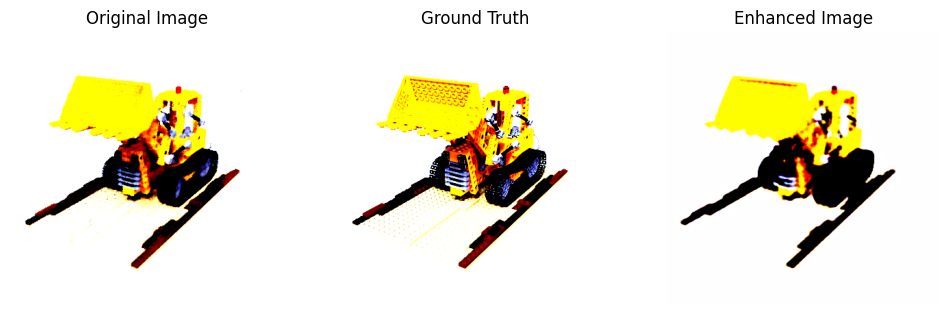

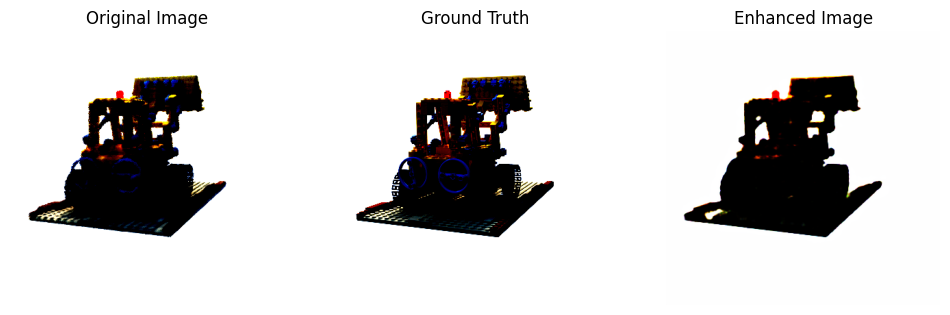

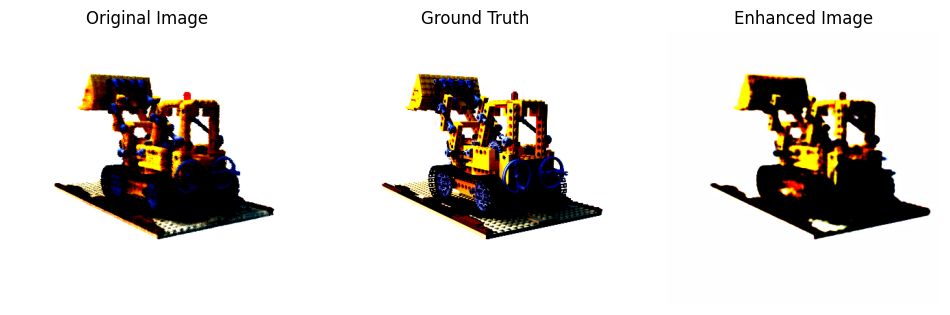

In [ ]:
import matplotlib.pyplot as plt

def visualize_comparisons(model, test_loader, num_images=5):
    model.eval()
    images_processed = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            outputs = outputs.cpu()
            inputs = inputs.cpu()
            labels = labels.cpu()


            for i in range(inputs.size(0)):
                if images_processed >= num_images:
                    return

                plt.figure(figsize=(12, 4))

                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(inputs[i].permute(1, 2, 0))
                plt.title("Original Image")
                plt.axis('off')

                # Ground Truth
                plt.subplot(1, 3, 2)
                plt.imshow(labels[i].permute(1, 2, 0))
                plt.title("Ground Truth")
                plt.axis('off')

                # Enhanced Image
                plt.subplot(1, 3, 3)
                plt.imshow(outputs[i].permute(1, 2, 0))
                plt.title("Enhanced Image")
                plt.axis('off')

                plt.show()

                images_processed += 1

visualize_comparisons(model, train_loader, num_images=5)

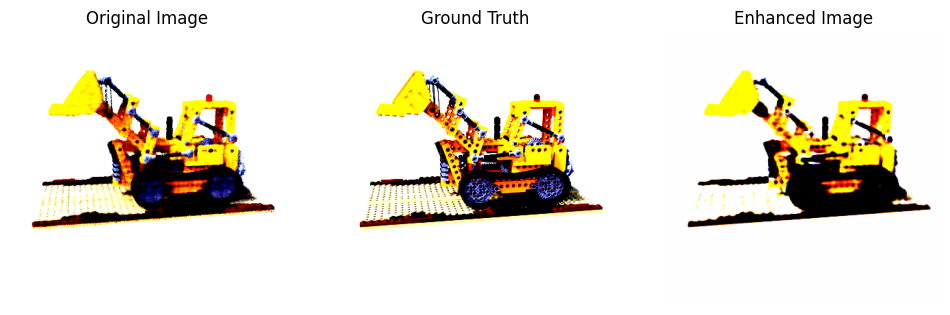

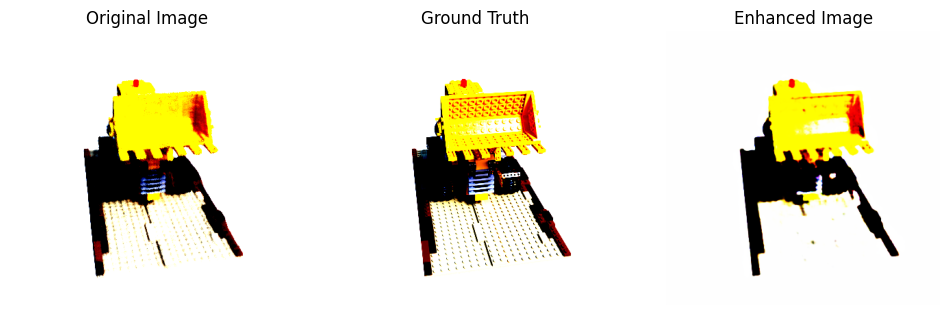

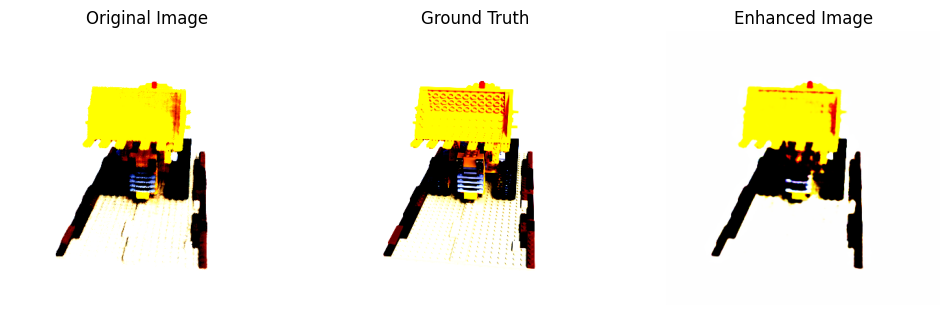

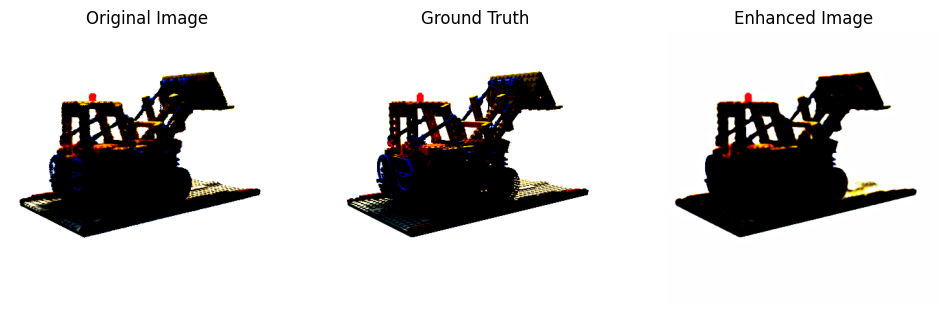

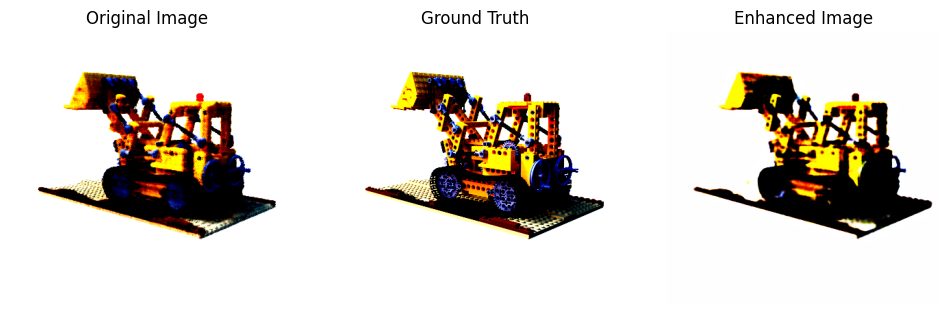

In [ ]:
import matplotlib.pyplot as plt

def visualize_comparisons(model, test_loader, num_images=5):
    model.eval()
    images_processed = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            outputs = outputs.cpu()
            inputs = inputs.cpu()
            labels = labels.cpu()


            for i in range(inputs.size(0)):
                if images_processed >= num_images:
                    return

                plt.figure(figsize=(12, 4))

                # Original Image
                plt.subplot(1, 3, 1)
                plt.imshow(inputs[i].permute(1, 2, 0))
                plt.title("Original Image")
                plt.axis('off')

                # Ground Truth
                plt.subplot(1, 3, 2)
                plt.imshow(labels[i].permute(1, 2, 0))
                plt.title("Ground Truth")
                plt.axis('off')

                # Enhanced Image
                plt.subplot(1, 3, 3)
                plt.imshow(outputs[i].permute(1, 2, 0))
                plt.title("Enhanced Image")
                plt.axis('off')

                plt.show()

                images_processed += 1

visualize_comparisons(model, train_loader, num_images=5)

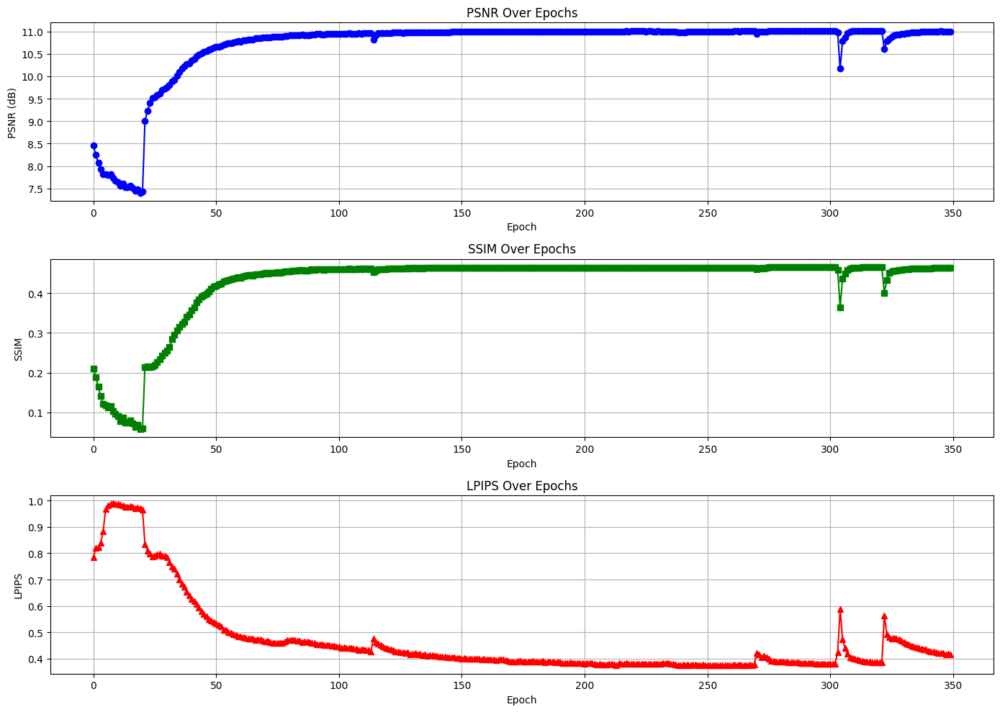

In [ ]:
plt.figure(figsize=(14, 10))

# PSNR
plt.subplot(3, 1, 1)  # 3 rows, 1 column, 1st subplot
plt.plot(list(range(len(psnr_values))), [i[0] for i in psnr_values], label='PSNR', marker='o', color='blue')
plt.title('PSNR Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.grid(True)

# SSIM
plt.subplot(3, 1, 2)  # 3 rows, 1 column, 2nd subplot
plt.plot(list(range(len(ssim_values))), [i[0] for i in ssim_values], label='SSIM', marker='s', color='green')
plt.title('SSIM Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.grid(True)

# LPIPS
plt.subplot(3, 1, 3)  # 3 rows, 1 column, 3rd subplot
plt.plot(list(range(len(lpips_values))), [i[0] for i in lpips_values], label='LPIPS', marker='^', color='red')
plt.title('LPIPS Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('LPIPS')
plt.grid(True)

plt.tight_layout()
plt.show()

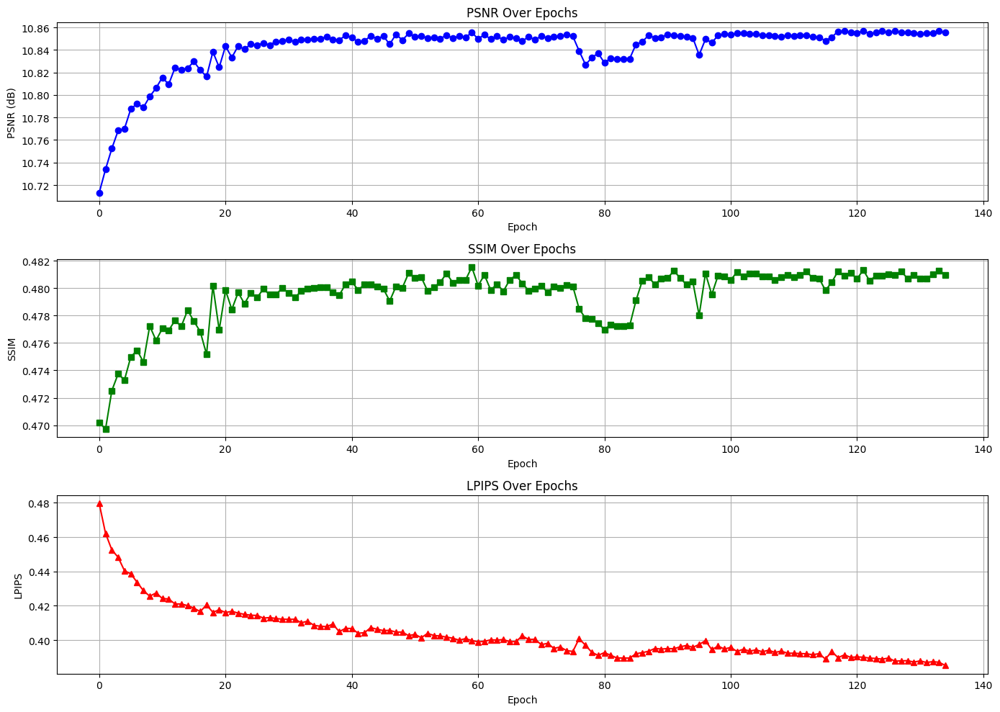

In [ ]:
plt.figure(figsize=(14, 10))

# PSNR
plt.subplot(3, 1, 1)  # 3 rows, 1 column, 1st subplot
plt.plot(list(range(len(psnr_values))), [i[0] for i in psnr_values], label='PSNR', marker='o', color='blue')
plt.title('PSNR Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.grid(True)

# SSIM
plt.subplot(3, 1, 2)  # 3 rows, 1 column, 2nd subplot
plt.plot(list(range(len(ssim_values))), [i[0] for i in ssim_values], label='SSIM', marker='s', color='green')
plt.title('SSIM Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.grid(True)

# LPIPS
plt.subplot(3, 1, 3)  # 3 rows, 1 column, 3rd subplot
plt.plot(list(range(len(lpips_values))), [i[0] for i in lpips_values], label='LPIPS', marker='^', color='red')
plt.title('LPIPS Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('LPIPS')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
#AVG,Median,Min,Max at the end

print(psnr_values[-1])
print(ssim_values[-1])
print(lpips_values[-1])

[10.8553793176512, 10.823096637052664, 10.786731819156174, 10.988592177343302]
[0.4809785783290863, 0.47398266, 0.47308803, 0.50286096]
[0.3852013200521469, 0.3879314064979553, 0.37088149785995483, 0.39406096935272217]


In [ ]:
test_dataset

In [ ]:
psnr2 = []
ssim2 = []
lpips2 = []

for input,labels in test_dataset:
    psnr2.append(psnr(labels.cpu().detach().numpy(),input.cpu().detach().numpy(),data_range = labels.max() - labels.min()))
    print(type(input.cpu().detach().numpy()))
    print(type(labels.cpu().detach().numpy()))
    lpips2.append(lpips_fn(input.cpu().detach().to(device),labels.cpu().detach().to(device)).item())

print(psnr2)
print(lpips2)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[tensor(27.3499), tensor(27.3212), tensor(26.8701), tensor(24.8058)]
[0.07763007283210754, 0.08109266310930252, 0.0869278609752655, 0.09883590042591095]


In [ ]:
[psnr(labels_np[i], outputs_np[i], data_range=labels_np[i].max() - labels_np[i].min()) for i in range(outputs_np.shape[0])]

In [ ]:
batch_ssim = [ssim(labels_np[i].transpose(1, 2, 0), outputs_np[i].transpose(1, 2, 0), multichannel=True) for i in range(outputs_np.shape[0])]
batch_lpips = [lpips_fn(outputs[i:i+1], labels[i:i+1]).item() for i in range(outputs.shape[0])]

DisabledFunctionError: cv2.imshow() is disabled in Colab, because it causes Jupyter sessions
to crash; see https://github.com/jupyter/notebook/issues/3935.
As a substitution, consider using
  from google.colab.patches import cv2_imshow


In [ ]:
(10.82 - 24.8058) / 24.8058

-0.563811689201719

In [ ]:
(59.8 + 56.3)/2

58.05

In [ ]:
(0.0988 - 0.3940) / 0.0988

-2.9878542510121457

In [ ]:
10.82

In [ ]:
(27.3212 + 26.8701)/2

27.09565

In [ ]:
(10.823 - 27.09565) / 27.09565

-0.6005631900323484

In [ ]:
(0.081 - 0.3879) / 0.081

-3.7888888888888888

In [ ]:
(0.077 - 0.394) / 0.077

-4.116883116883117

In [ ]:
(411 + 298) / 2

354.5